# Mini-Project 3 - Part 2. EDA and Machine Learning

This is Part 2 of the Mini-Project 3, which deals with performing EDA and applying machine learning algorithms to build the best predictive model of general sentiment of business/finance news articles.

In [1]:
# !pip install wordcloud

## Import Libraries and Prepare Dataframes

In [2]:
## Pandas and Numpy
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np

## Regex & Miscellaneous
import re as re
import time as timer
from datetime import datetime, date, time
from tqdm import tqdm
from collections import Counter
import pickle

## Sentiment Analysis
import spacy
import nltk
from spacy.lang.en.stop_words import STOP_WORDS
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

## Machine Learning Algorithms
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

import gensim
from gensim.models import Word2Vec

from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold 
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import accuracy_score, roc_curve, auc, classification_report, recall_score, precision_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostClassifier

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

## Data Visualisation Modules
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
from matplotlib.colors import BoundaryNorm, ListedColormap
from wordcloud import WordCloud, STOPWORDS

In [3]:
## Import the dataframe
df = pd.read_pickle("df_copy.pkl") 
sp500 = pd.read_pickle("df_group.pkl")
df_test = pd.read_pickle("df_copy_0009.pkl") 


In [4]:
df ## Check to see that dataframe has been correctly imported

,date,original,shorts,class
0,1990-01-01,lead nicholas f brady a diffident modest well ...,nicholas f brady diffident modest bear wall st...,0
1,1990-01-01,lead in the worlds stock markets 1989 was a ye...,world stock market year unexpected,1
2,1990-01-01,lead at a time when bankers and economists spe...,time banker economist speak global financial v...,1
3,1990-01-02,lead for years wall street has been a beacon o...,year wall street beacon wealth glamour talente...,1
4,1990-01-02,lead wall street outlook for many people inves...,wall street outlook people invest like have mi...,1
...,...,...,...,...
8469,1999-12-29,market place column on whether commodity price...,market place column commodity price remain str...,1
8470,1999-12-30,nasdaq ends above 4000 and is up 84 % for the ...,nasdaq end year nasdaq composite index way goo...,1
8471,1999-12-30,dow jones industrial average nasdaq composite ...,dow jones industrial average nasdaq composite ...,1
8472,1999-12-30,conference board reports index of leading econ...,conference board report index lead economic in...,1


In [5]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = pd.DatetimeIndex(df['date']).year
df['month'] = pd.DatetimeIndex(df['date']).month
df['day'] = pd.DatetimeIndex(df['date']).day

In [6]:
df

,date,original,shorts,class,year,month,day
0,1990-01-01,lead nicholas f brady a diffident modest well ...,nicholas f brady diffident modest bear wall st...,0,1990,1,1
1,1990-01-01,lead in the worlds stock markets 1989 was a ye...,world stock market year unexpected,1,1990,1,1
2,1990-01-01,lead at a time when bankers and economists spe...,time banker economist speak global financial v...,1,1990,1,1
3,1990-01-02,lead for years wall street has been a beacon o...,year wall street beacon wealth glamour talente...,1,1990,1,2
4,1990-01-02,lead wall street outlook for many people inves...,wall street outlook people invest like have mi...,1,1990,1,2
...,...,...,...,...,...,...,...
8469,1999-12-29,market place column on whether commodity price...,market place column commodity price remain str...,1,1999,12,29
8470,1999-12-30,nasdaq ends above 4000 and is up 84 % for the ...,nasdaq end year nasdaq composite index way goo...,1,1999,12,30
8471,1999-12-30,dow jones industrial average nasdaq composite ...,dow jones industrial average nasdaq composite ...,1,1999,12,30
8472,1999-12-30,conference board reports index of leading econ...,conference board report index lead economic in...,1,1999,12,30


In [7]:
df_test['date'] = pd.to_datetime(df_test['date'])
df_test['year'] = pd.DatetimeIndex(df_test['date']).year
df_test['month'] = pd.DatetimeIndex(df_test['date']).month
df_test['day'] = pd.DatetimeIndex(df_test['date']).day

In [8]:
df_test

,date,original,shorts,class,year,month,day
0,2000-01-01,russian stocks leap after yeltsin steps aside ...,russian stock leap yeltsin step aside boris n ...,1,2000,1,1
1,2000-01-01,floyd norris column offers review of stock mar...,floyd norris column offer review stock market ...,1,2000,1,1
2,2000-01-02,clifford krauss article discusses volatility...,clifford krauss article discuss volatility lat...,1,2000,1,2
3,2000-01-02,jesse l jackson jr congressman and son of rev ...,jesse l jackson jr congressman son rev jessie ...,0,2000,1,2
4,2000-01-02,lipper inc research firm says net new investme...,lipper inc research firm say net new investmen...,0,2000,1,2
...,...,...,...,...,...,...,...
8528,2009-12-24,shares on wall street rose closing at their hi...,share wall street rise close high level year r...,1,2009,12,24
8529,2009-12-24,with the markets winding up for the christmas ...,market wind christmas holiday think poem fitti...,0,2009,12,24
8530,2009-12-26,were you out of the stock market when it turne...,stock market turn march get plenty company,1,2009,12,26
8531,2009-12-29,the latest home price index showed a small gai...,late home price index show small gain october ...,1,2009,12,29


There are 8474 news articles from time period 1990 to 1999, and 8533 news articels from the time period 2000 to 2009.
We will use news articles from 1990 to 1999 to train and validate our models, and use news articles from 2000 to 2009 to do the final testing of the predictive model.

## 4. Exploratory Data Analysis

In [9]:
## Helper function for creating plots
def create_plot(df, start_year = 1990, end_year = 1999, plot = "pie"):
    
    rows=5
    cols=2
    
    if plot == "pie":
        width = 20
        height = 40
        fig, ax = plt.subplots(rows, cols, figsize=(width,height))
        fig.suptitle(f"Plots from {start_year} to {end_year}",
                      fontsize = 24)
        
    elif plot == "cloud":
        width = 20
        height = 25
        fig, ax = plt.subplots(rows, cols, figsize=(width,height))
        fig.suptitle(f"Plots from {start_year} to {end_year}",
                      fontsize = 24)
    else:
        width = 10
        height = 25
        
    decade = list(range(start_year, end_year + 1))
    
    row=0 
    col=0 
    
    
    ### PIE CHART
    if plot == "pie":
        for i in range(len(decade)):
            df_temp = df[df.year == decade[i]]
            df_temp["labels"] = df_temp["class"]
            df_temp["labels"] = df_temp["labels"].replace({1: "Positive",0: "Neutral", -1:"Negative"}) 
            labels = df_temp["labels"].unique()
            data = [df_temp["labels"][df_temp["labels"] == label].count() for label in labels] 
            ## Count the number of specific label in the column.
                
            colors = sns.color_palette('pastel')[0:df_temp["labels"].nunique()]
        
            patches, texts, pcts = ax[row][col].pie(data, labels=labels, autopct='%.1f%%',
                                                    wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
                                                    textprops={'size': 'x-large'},
                                                    startangle=90)
            
            ax[row][col].set_title(f"Year {decade[i]}", fontsize = 20)
            # For each wedge, set the corresponding text label color to the wedge's face color.
            for i, patch in enumerate(patches):
                texts[i].set_color(patch.get_facecolor())
            plt.setp(pcts, color='white', fontsize = 18)
            plt.setp(texts, fontsize=20)
            plt.tight_layout()
            
            col=col+1
            if col==cols:
                row=row+1
                col=0
        
    
    ### WORDCLOUD
    if plot == "cloud":
        for i in range(len(decade)):
            df_temp = df[df.year == decade[i]]
            plot = plot_wordcloud(df_temp)
            ax[row][col].imshow(plot, interpolation="bilinear")
            ax[row][col].axis("off")
    
            ax[row][col].set_title(f"Year {decade[i]}", fontsize = 20, pad = 20)
            plt.tight_layout()
            col=col+1
            if col==cols:
                row=row+1
                col=0
    
    ### AREA Plot
    if plot == "area":
        for i in range(len(decade)):
            df_temp = df[df.year == decade[i]]
            dfp = df_temp.pivot_table(index=df_temp.month, columns='class', values='month', aggfunc='count')
            dfp2 = dfp.apply(lambda x: x/sum(x)*100, axis=1)

            dfp2.plot.area(stacked=True, 
                           figsize=(10, 6),
                           fontsize = 14)
            
            plt.legend(title='Category', 
                       labels = ["Negative", "Neutral", "Positive"], 
                       loc = "upper left")
            
            plt.xlabel('Month', fontsize=18)
            plt.ylabel('Count (%)', fontsize=18)
            plt.title(f'Sum of Monthly Sentiment for Year {decade[i]}', fontsize = 20, pad = 20)
    

    plt.subplots_adjust(top = 0.95)
    plt.show()
    
    return

### 4.1 Overall Sentiment Distribution for Each Year

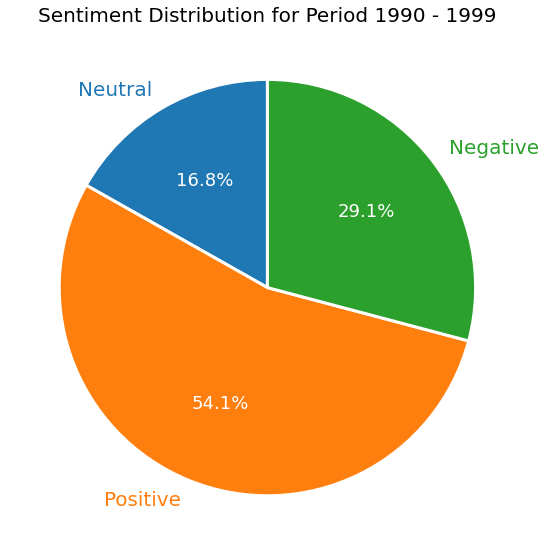

In [10]:
plt.rcParams['figure.figsize'] = [14, 8]
plt.rcParams['font.size'] = '16'

df["labels"] = df["class"]
df["labels"] = df["labels"].replace({1: "Positive",0: "Neutral", -1:"Negative"}) 
labels = df["labels"].unique()
data = [df["labels"][df["labels"] == label].count() for label in labels] 
## Count the number of specific label in the column.
    
colors = sns.color_palette('pastel')[0:df["labels"].nunique()]
patches, texts, pcts = plt.pie(data, labels=labels, autopct='%.1f%%',
                                        wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
                                        textprops={'size': 'x-large'},
                                        startangle=90)

plt.title(f"Sentiment Distribution for Period 1990 - 1999", fontsize = 20)
# For each wedge, set the corresponding text label color to the wedge's face color.
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='white', fontsize = 18)
plt.setp(texts, fontsize=20)
plt.tight_layout()
plt.show()

Analysis: 
- Majority (54%) of the news article sentiment during the 90s was positive. This makes sense because the 1990s was regarded as the golden era for the stock market boom, so you'd expect mostly positive news about the economy and the stock market.
- Neutral sentiment was the lowest at 17%, and the negative sentiment was at 29%.

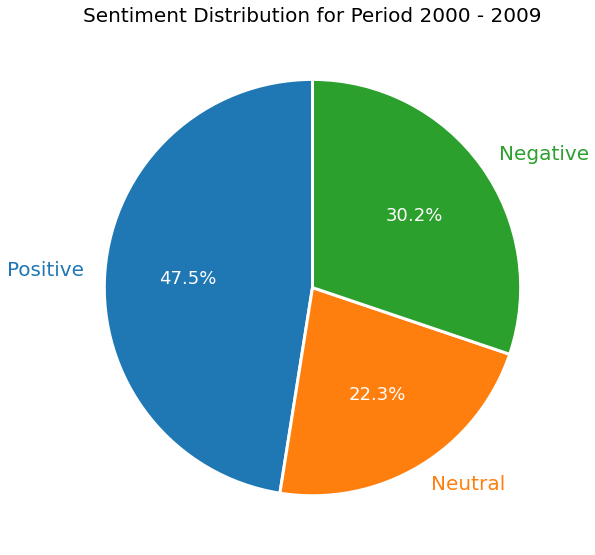

In [11]:
plt.rcParams['figure.figsize'] = [14, 8]
plt.rcParams['font.size'] = '16'

df_test["labels"] = df_test["class"]
df_test["labels"] = df_test["labels"].replace({1: "Positive",0: "Neutral", -1:"Negative"}) 
labels = df_test["labels"].unique()
data = [df_test["labels"][df_test["labels"] == label].count() for label in labels] 
## Count the number of specific label in the column.
    
colors = sns.color_palette('pastel')[0:df_test["labels"].nunique()]
patches, texts, pcts = plt.pie(data, labels=labels, autopct='%.1f%%',
                                        wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
                                        textprops={'size': 'x-large'},
                                        startangle=90)

plt.title(f"Sentiment Distribution for Period 2000 - 2009", fontsize = 20)
# For each wedge, set the corresponding text label color to the wedge's face color.
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
plt.setp(pcts, color='white', fontsize = 18)
plt.setp(texts, fontsize=20)
plt.tight_layout()
plt.show()

Analysis:
- The proportion of positive news for the 2000s has dropped by about 5% compared to the 1990s, with the negative and neutral news sentiments increasing.
- This aligns with the fact that the Great Recession (also known as the 2007 financial crisis) occured during this period.

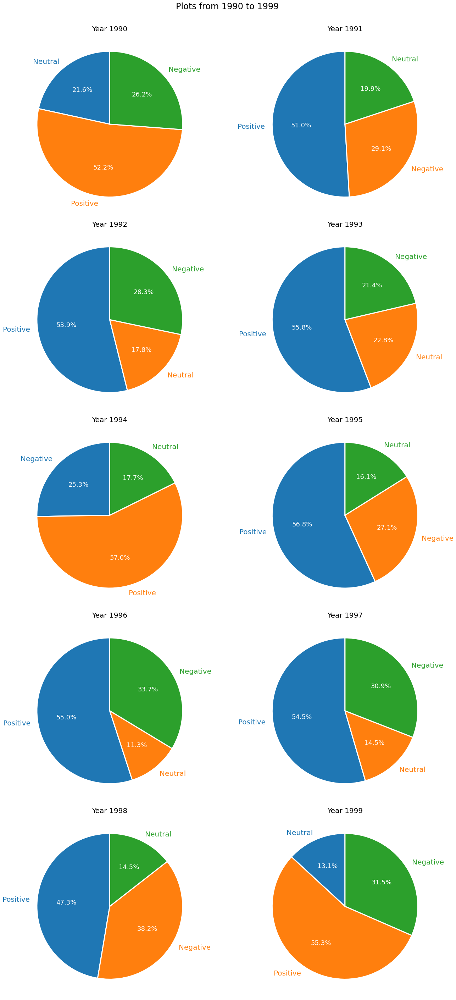

In [12]:
create_plot(df)

Analysis:
- From the year-by-year analysis, we see that from 1994 to 1997, the positive sentiment was almost at 60% of the overall news.
- This aligns with the historical fact that there was a sharp increase in stock market during this period.

### 4.2 Word Cloud

In [13]:
def plot_wordcloud(df):

    stopwords = set(STOPWORDS)
    stopwords.update(["wall", "street", "stock", "market", "index", "standards", "poors", "poor", "price", "dow", "jones",
                      "corporation", "inc", "trade", "investor", "company", "place", "period", "department", "association",
                      "close", "composite", "new", "york", "week", "year", "group", "norris", "morgenson", "board", "banker",
                      "hulbert", "fuerbringer"])
    
    text = " ".join(cat.split()[1] for cat in df.shorts)
    # Creating word_cloud with text as argument in .generate() method
    wordcloud = WordCloud(width = 1000, height = 600,
                background_color ='white',
                stopwords = stopwords,
                colormap = "viridis",
                max_words = 200,
                min_font_size = 10).generate(text)

    return wordcloud

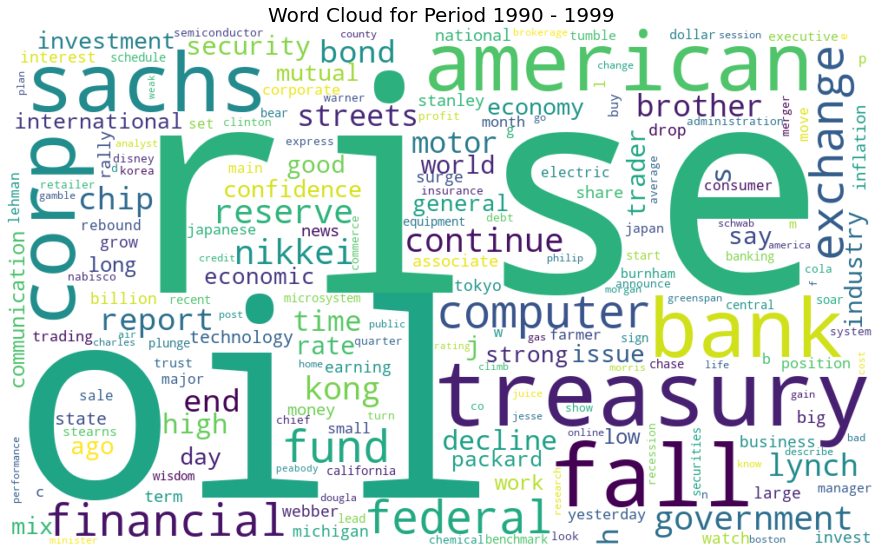

In [14]:
plt.rcParams['figure.figsize'] = [14, 8]
plt.rcParams['font.size'] = '16'

plot = plot_wordcloud(df)
plt.imshow(plot, interpolation="bilinear")
plt.axis("off")
plt.title(f"Word Cloud for Period 1990 - 1999", fontsize = 20)
plt.tight_layout()

Analysis:
- Word cloud for 1990s shows that the most frequent word used was "rise" followed by "oil", which indicates rising stock market prices. Oil was also an interesting topic during this time, because the crude oil price was the lowest in history during this period.
- Other common words include computer and nikkei, which were two of the key interests during the period. There was a huge interest in computer industry due to the rise of the Internet and the dotcom boom, and the japanese economy rivalled that of the US economy during this time.

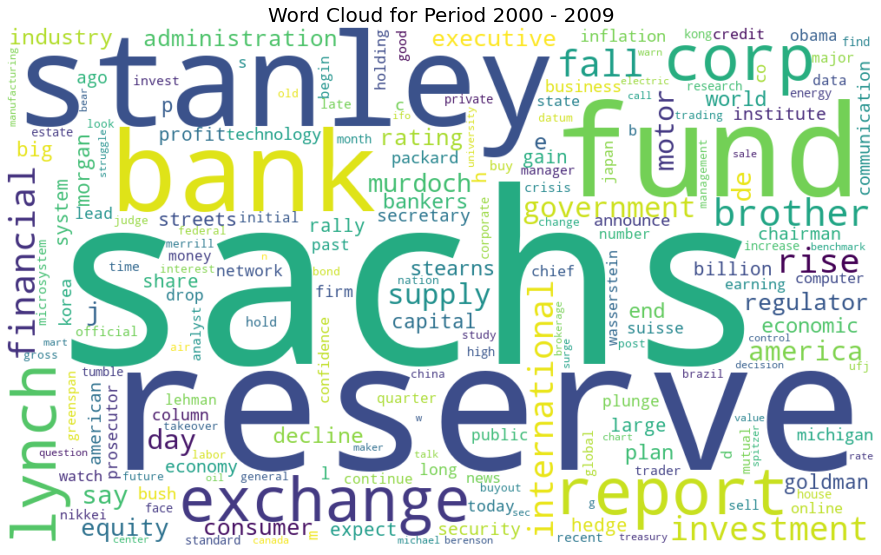

In [15]:
plt.rcParams['figure.figsize'] = [14, 8]
plt.rcParams['font.size'] = '16'

plot = plot_wordcloud(df_test)
plt.imshow(plot, interpolation="bilinear")
plt.axis("off")
plt.title(f"Word Cloud for Period 2000 - 2009", fontsize = 20)
plt.tight_layout()

Analysis:
- During the 2000s, the most frequent words were actually names of the Wall Street investment banks, most notably Goldman Sachs, and Morgan Stanley, which were the two major banks that were in serious trouble during the Great Recession.
- The word "fall" became more prominent than the word "rise", which is another contrast to what we saw in the word cloud for 1990s.

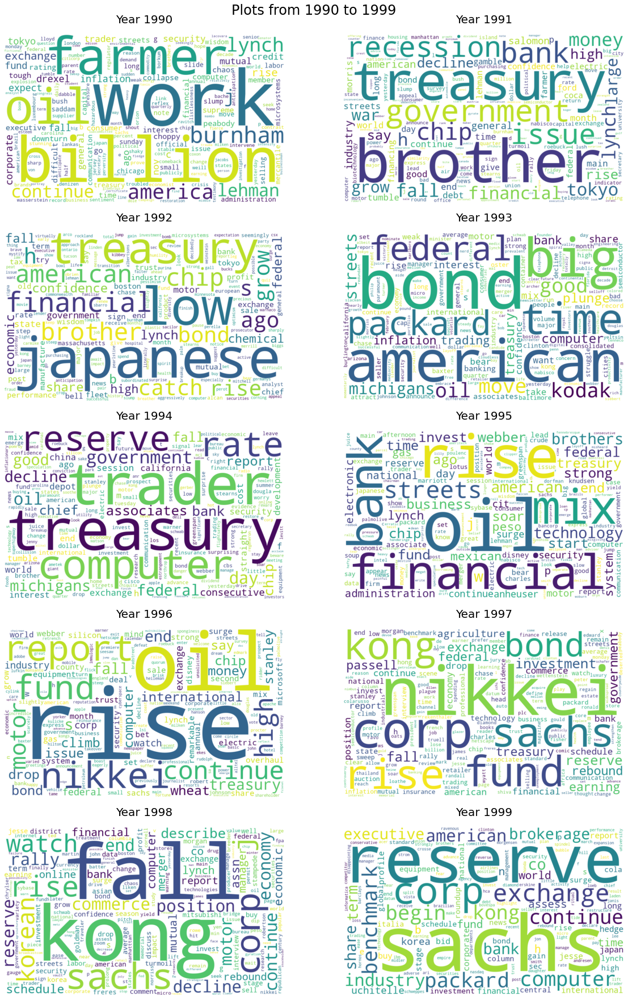

In [16]:
create_plot(df, start_year = 1990, end_year = 1999, plot = "cloud")


Analysis:
- The general trend of increasing market prices during 1995 - 1997 is reinforced by the prominence of the words "rise", and "nikkei".
- The word "fall" and "kong" indicates the crash of the Asian markets, especially Hong Kong, which occurred in 1998.

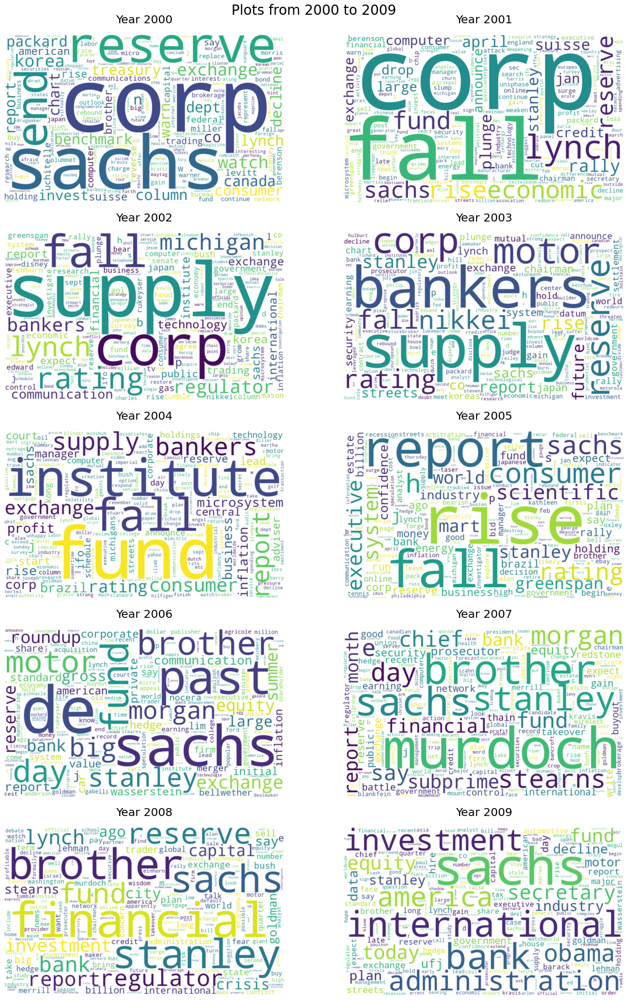

In [17]:
create_plot(df_test, start_year = 2000, end_year = 2009, plot = "cloud")

Analysis:
- Words related to the name of investment banks and the word "bank" in general becomes more prominent in the late 2000s.
- The words "financial" and "crisis" became prominent in 2008, following the Great Recession, along with the names of the banks that went bankrupt or resulted in a serious financial trouble.

### 4.3 Overall Sentiment over Time

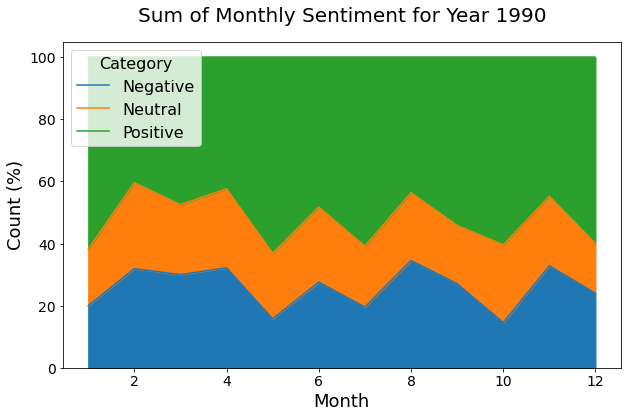

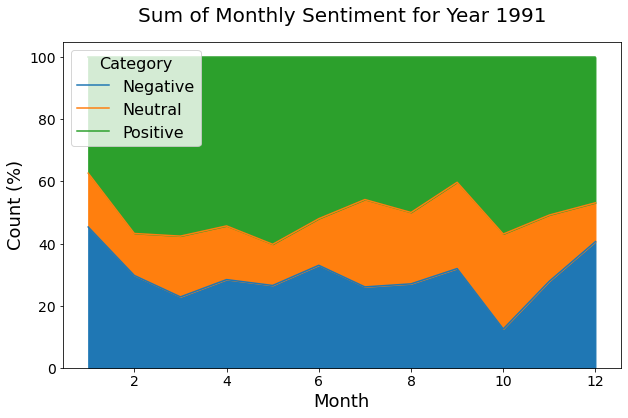

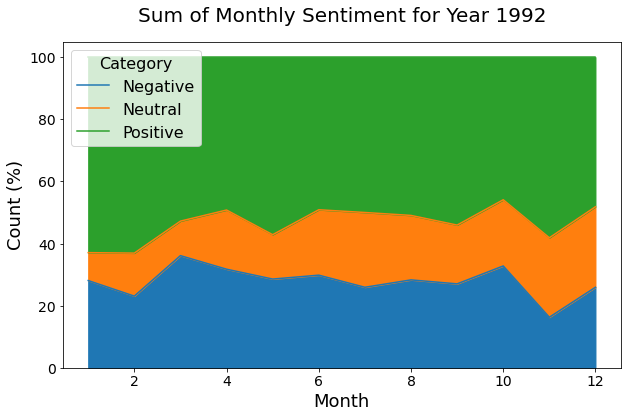

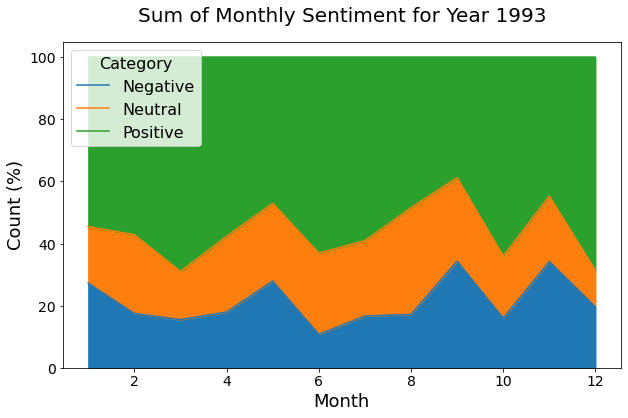

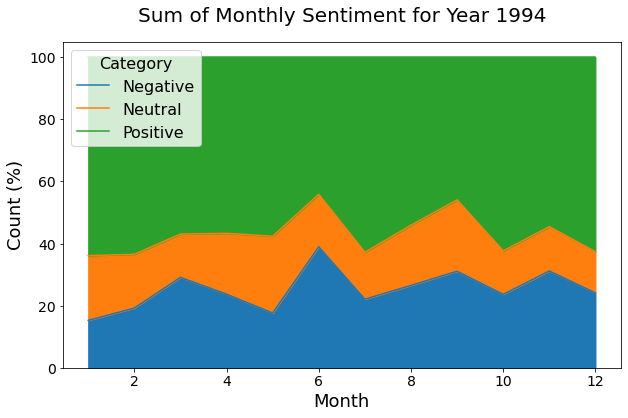

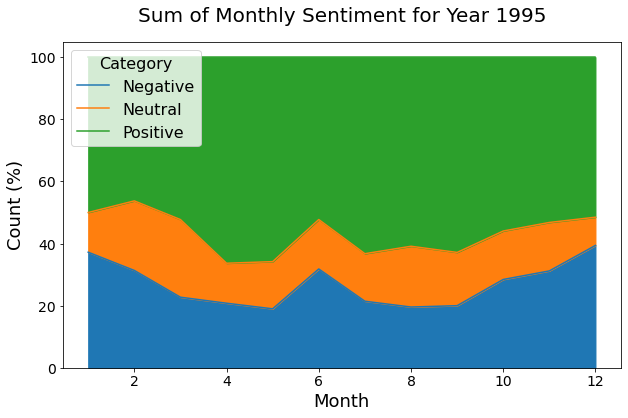

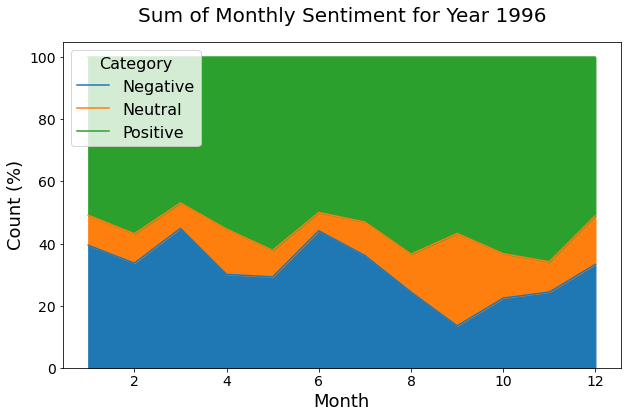

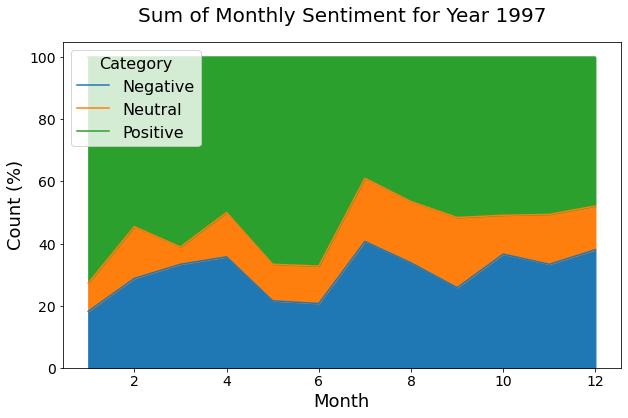

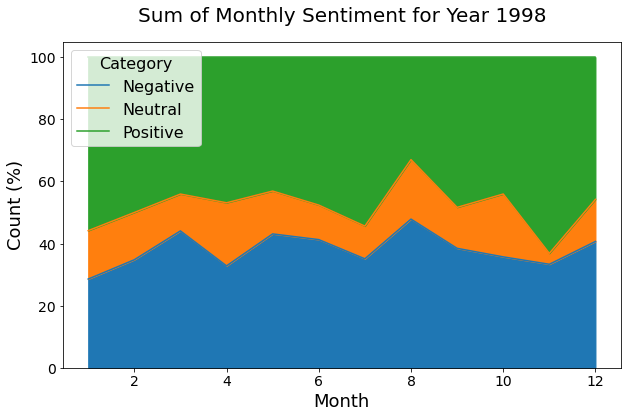

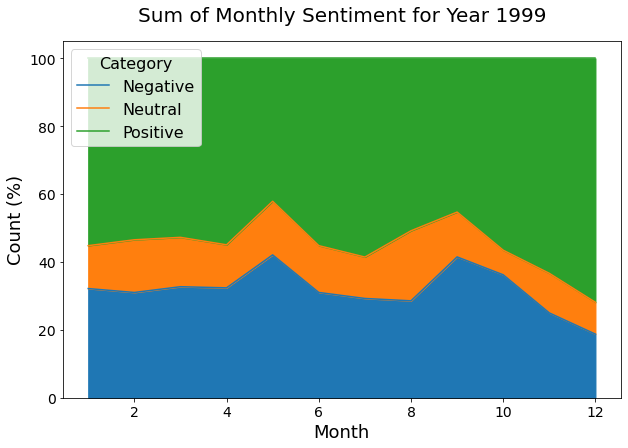

In [18]:
create_plot(df, start_year = 1990, end_year = 1999, plot = "area")

Analysis:
- There seems to be no real pattern in how the sentiment changes over the course of a single year (i.e. no seasonality).

In [19]:
sp500 = sp500.to_frame() ## Convert a series into a dataframe

In [20]:
sp500["change"] = ""
changes = [0]
for i in range(len(sp500)- 1):
    value1 = sp500.iloc[i+1]["Close"]
    value2 = sp500.iloc[i]["Close"]
    change = ((value2 - value1)/value1 * 100)
    changes.append(change)
sp500["change"] = changes

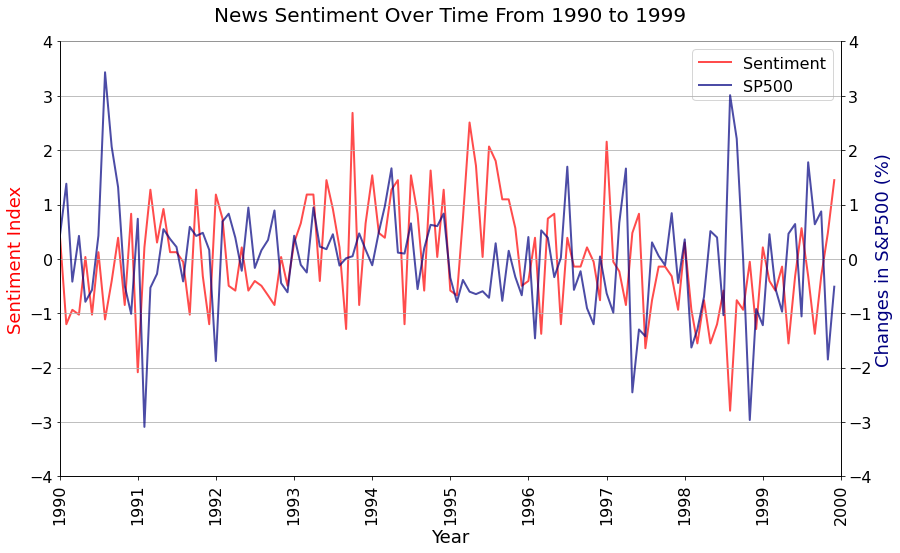

In [21]:
scaler = StandardScaler()

df_temp  = df.copy()
df_group = df_temp.groupby(["year", "month"]).agg({'class': ["sum"]})

scaled = scaler.fit_transform(df_group["class"])
scaled2 = scaler.fit_transform(np.array(sp500["change"]).reshape(-1, 1))

df_group["class"] = scaled
sp500["change"] = scaled2 
    
dates = []
for i , value in enumerate(df_group.index):
    year = value[0]
    month = value[1]
    dates.append(pd.to_datetime(str(year) + '/' + str(month) + '/01'))
    
df_group["dates"] = dates
df_group.set_index('dates', inplace=True, drop=True)

dates = []
for i , value in enumerate(sp500.index):
    year = value[0]
    month = value[1]
    d = (str(year) + '-' + str(month) + '-01')
    dates.append(pd.to_datetime(d))
    
sp500["dates"] = dates
sp500.set_index('dates', inplace=True, drop=True)


datetime_object = datetime.strptime('2000-01-01 00:00:00', '%Y-%m-%d %H:%M:%S')

plt.rcParams['figure.figsize'] = [14, 8]
plt.rcParams['font.size'] = '16'

fig = plt.figure()
ax1 = fig.add_subplot(111)

color = 'red'
plot1 = ax1.plot(df_group.index, df_group[('class', 'sum')], 
                 linewidth = 2, label = "Sentiment", color = color, alpha = 0.7)

plt.title("News Sentiment Over Time From 1990 to 1999", fontsize =20, pad = 20)
plt.xlabel("Year", fontsize = 18)
plt.xticks(rotation=90)
plt.ylabel("Sentiment Index", fontsize = 18, color = color)
plt.ylim(-4, 4)

ax2 = ax1.twinx()

color = 'navy'
plot2 = ax2.plot(sp500.index, sp500.change, linewidth = 2, label = "SP500", color = color, alpha = 0.7)
plt.ylabel("Changes in S&P500 (%)", fontsize = 18, color = color)

plt.grid(axis = 'y')
plt.ylim(-4, 4)
plt.xlim(dates[0], datetime_object)
ax2.spines['top'].set_visible(False)

# added these three lines
plots = plot1 + plot2
labs = [l.get_label() for l in plots]
ax1.legend(plots, labs, loc="upper right")

plt.show()

Analysis:
- This chart shows normalised monthly sentiments (overall sentiment for a particular month) compared to the normalised monthly change in the S&P 500 index during the 1990s.
- Ideally, we would like to see the sentiment curve align with the stock market curve.
- There are times when the curves align (for example, from 1991 to 1992) but in other periods, the two curves seem to contradict each other (for example, from 1995 to 1996).
- It may be possible that monthly values are not quite correlated to each other, and we should instead look at daily changes.
- Another possibility is that there is a delay in how news sentiments affect the stock market.

In [22]:
corr = pd.concat([df_group, sp500], axis = 1)

In [23]:
corr = corr.drop(['Close'], axis=1)
corr.rename(columns = {('class','sum'):'sentiment'}, inplace = True)

In [24]:
corr.corr()

,sentiment,change
sentiment,1.000000,-0.191804
change,-0.191804,1.000000


Analysis:
- The correlation between news sentiment and the change in the market price is -0.19.
- The negative correlation is quite interesting, because we would expect a positive correlation between the two values.
- Again, this may be an indication that there is a delay in how the news sentiment affects the market prices.

## 5. Machine Learning

### 5.1 Split the data

In [25]:
df_copy = df.copy()

In [26]:
# Features and Labels
X = df_copy['shorts']
y = df_copy['class']

# split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 1)

In [27]:
y_array = np.array(y_test)

In [28]:
count = y_array.tolist().count(1)
print(count)

900


In [29]:
count = y_array.tolist().count(0)
print(count)

282


In [30]:
count = y_array.tolist().count(-1)
print(count)

513


### 5.2 Building the Model and Making Predictions

#### Dimension Reduction Analysis

In [31]:
max_features = [100, 200, 500, 1000, 2000, 5000, 10000]

In [32]:
clf = SVC(kernel='linear', probability=True, C = 0.01, gamma = "auto")

train_scores = []
test_scores = []

for max_feature in max_features:
    print(f"Training {max_feature} features")
    counts = CountVectorizer(max_features=max_feature, ngram_range=(1, 1))
    
    A = counts.fit_transform(X_train.values.tolist())
    B = counts.transform(X_test)
    
    clf.fit(A, y_train)
    train_score = clf.score(A, y_train)
    
    pred = clf.predict(B)
    prob = clf.predict_proba(B)
    
    acc = accuracy_score(y_test, pred)
    
    train_scores.append(train_score)
    test_scores.append(acc)

Training 100 features
Training 200 features
Training 500 features
Training 1000 features
Training 2000 features
Training 5000 features
Training 10000 features


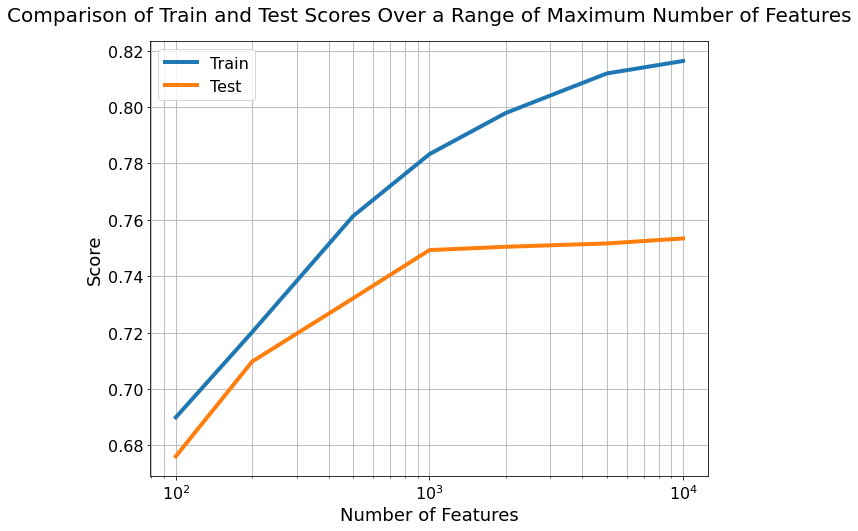

In [33]:
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['font.size'] = '16'

ax = plt.subplot()
plt.plot(max_features, train_scores, linewidth = 4, label = "Train")
plt.plot(max_features, test_scores, linewidth = 4, label = "Test")
ax.set_xscale('log')
plt.title("Comparison of Train and Test Scores Over a Range of Maximum Number of Features", fontsize = 20, pad = 20)
plt.xlabel("Number of Features", fontsize = 18)
plt.ylabel("Score", fontsize = 18)
plt.grid(axis = 'both', which = 'both')
plt.legend()
plt.show()

Analysis:
- Using more than 1000 features results in overfitting (training score >= 0.78, test score = 0.74).
- It is recommended to use only 1000 features for the rest of the modelling.

### A. Bag-Of-Words (Count Vector)

In [34]:
# helper function to show results and charts
def show_summary_report(actual, prediction, probabilities):
    # Confusion Matrix
    plt.rcParams['figure.figsize'] = [5, 5]
    plt.rcParams['font.size'] = '14'
    
    ConfusionMatrixDisplay.from_predictions(actual, prediction, display_labels=["Negative", "Neutral", "Positive"])
    
    plt.grid(alpha = 0)
    plt.show()
    
    print(f"Classification Report: \n", classification_report(actual,prediction))
    

In [35]:
## Helper function for plotting comparison graphs

def plot_comparison(C_list, train_scores, test_scores, name = "C"):
    plt.rcParams['figure.figsize'] = [10, 8]
    plt.rcParams['font.size'] = '16'
    
    ax = plt.subplot()
    plt.plot(C_list, train_scores, linewidth = 4, label = "Train")
    plt.plot(C_list, test_scores, linewidth = 4, label = "Test")
    plt.title(f"Comparison of Train and Test Scores Over a Range of {name} Values", fontsize = 20, pad = 20)
    plt.xlabel(f"{name.title()}", fontsize = 18)
    plt.ylabel("Score", fontsize = 18)
    plt.grid(axis = 'both', which = 'both')
    plt.legend()
    ax.set_xscale('log')
    plt.show()
    
    return

In [36]:
## Helper function for training the model and predicting using count vector

def get_vector_model(X, y, model = "log", C = 1, v_name = "count", rs = 1):
    # split the dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = rs)
    
    # create a matrix of word counts from the text
    if v_name == "count":
        vector = CountVectorizer(max_features=1000, ngram_range=(1, 1))
    else:
        vector = TfidfVectorizer(max_features=1000, ngram_range=(1, 1))
    
    # create a classifier 
    if model == "log":
        clf = LogisticRegression(n_jobs=1, C = C, max_iter = 10000, class_weight="balanced")
    elif model == "svm":   
        clf = SVC(kernel='linear', probability=True, C = C, gamma = "auto")
    else:
        clf = GaussianNB()
        
    # do the actual counting
    # do the transformation for the test data
    # NOTE: use `transform()` instead of `fit_transform()`
    A = vector.fit_transform(X_train.values.tolist())
    B = vector.transform(X_test)
    
    # train the classifier with the training data
    if model == "nb":
        clf.fit(A.toarray(), y_train)
        train_score = clf.score(A.toarray(), y_train)
    else:
        clf.fit(A, y_train)
        train_score = clf.score(A, y_train)
    
#       cv_score = np.mean(cross_val_score(clf, A.toarray(), y_train, cv=3))
#       print(f"Mean Cross-Validation Score: %.3f" % cv_score)
    
    if model == "nb":
        pred = clf.predict(B.toarray())
        prob = clf.predict_proba(B.toarray())
    else:
        pred = clf.predict(B)
        prob = clf.predict_proba(B)
    
    test_score = accuracy_score(y_test, pred)
    
    print(f"\nShowing results for {model.title()} Model, C = {C}")
    
    show_summary_report(y_test, pred, prob)
    
    print(f"Training Accuarcy: %.3f" % train_score)
    print('Test Accuracy %.3f' % test_score)
    
    return round(train_score, 3), round(test_score, 3), clf, vector


Showing results for Log Model, C = 1


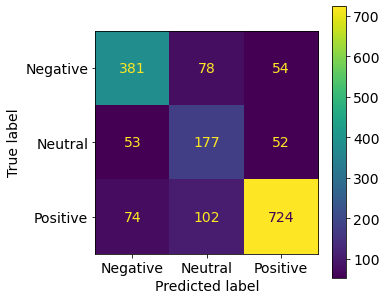

Classification Report: 
               precision    recall  f1-score   support

          -1       0.75      0.74      0.75       513
           0       0.50      0.63      0.55       282
           1       0.87      0.80      0.84       900

    accuracy                           0.76      1695
   macro avg       0.71      0.72      0.71      1695
weighted avg       0.77      0.76      0.76      1695

Training Accuarcy: 0.890
Test Accuracy 0.756


In [37]:
train_score, test_score, _, _ = get_vector_model(X, y, C = 1)

In [38]:
print(train_score, test_score)

0.89 0.756


### Testing the score for count vector using logistic regression


Showing results for Log Model, C = 0.001


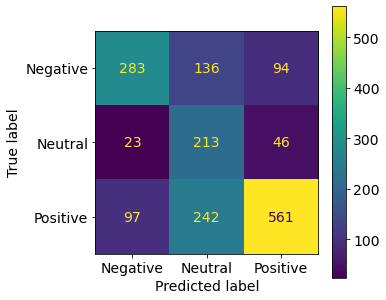

Classification Report: 
               precision    recall  f1-score   support

          -1       0.70      0.55      0.62       513
           0       0.36      0.76      0.49       282
           1       0.80      0.62      0.70       900

    accuracy                           0.62      1695
   macro avg       0.62      0.64      0.60      1695
weighted avg       0.70      0.62      0.64      1695

Training Accuarcy: 0.643
Test Accuracy 0.624

Showing results for Log Model, C = 0.05


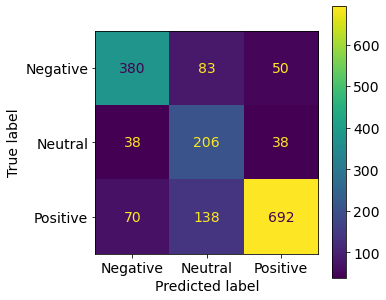

Classification Report: 
               precision    recall  f1-score   support

          -1       0.78      0.74      0.76       513
           0       0.48      0.73      0.58       282
           1       0.89      0.77      0.82       900

    accuracy                           0.75      1695
   macro avg       0.72      0.75      0.72      1695
weighted avg       0.79      0.75      0.76      1695

Training Accuarcy: 0.825
Test Accuracy 0.754

Showing results for Log Model, C = 0.1


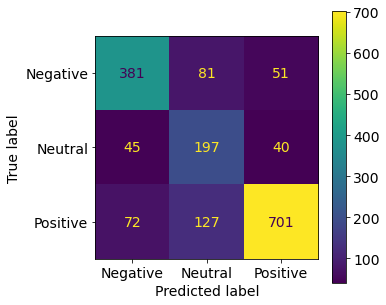

Classification Report: 
               precision    recall  f1-score   support

          -1       0.77      0.74      0.75       513
           0       0.49      0.70      0.57       282
           1       0.89      0.78      0.83       900

    accuracy                           0.75      1695
   macro avg       0.71      0.74      0.72      1695
weighted avg       0.78      0.75      0.76      1695

Training Accuarcy: 0.844
Test Accuracy 0.755

Showing results for Log Model, C = 0.5


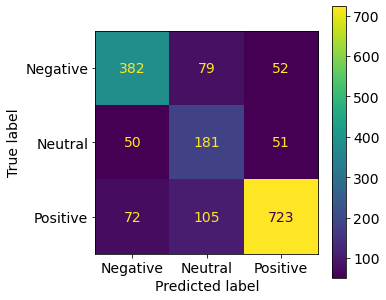

Classification Report: 
               precision    recall  f1-score   support

          -1       0.76      0.74      0.75       513
           0       0.50      0.64      0.56       282
           1       0.88      0.80      0.84       900

    accuracy                           0.76      1695
   macro avg       0.71      0.73      0.72      1695
weighted avg       0.78      0.76      0.77      1695

Training Accuarcy: 0.879
Test Accuracy 0.759

Showing results for Log Model, C = 1


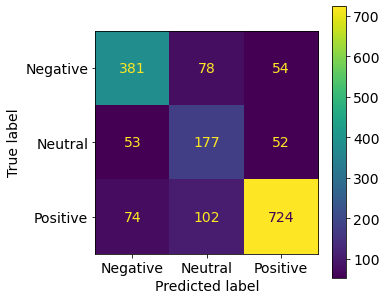

Classification Report: 
               precision    recall  f1-score   support

          -1       0.75      0.74      0.75       513
           0       0.50      0.63      0.55       282
           1       0.87      0.80      0.84       900

    accuracy                           0.76      1695
   macro avg       0.71      0.72      0.71      1695
weighted avg       0.77      0.76      0.76      1695

Training Accuarcy: 0.890
Test Accuracy 0.756


In [39]:

C_list = [0.001, 0.05, 0.1, 0.5, 1]

train_scores_count = []
test_scores_count = []

for C in C_list:
    train_score, test_score, _, _ = get_vector_model(X, y, C = C)
    
    train_scores_count.append(train_score)
    test_scores_count.append(test_score)
     

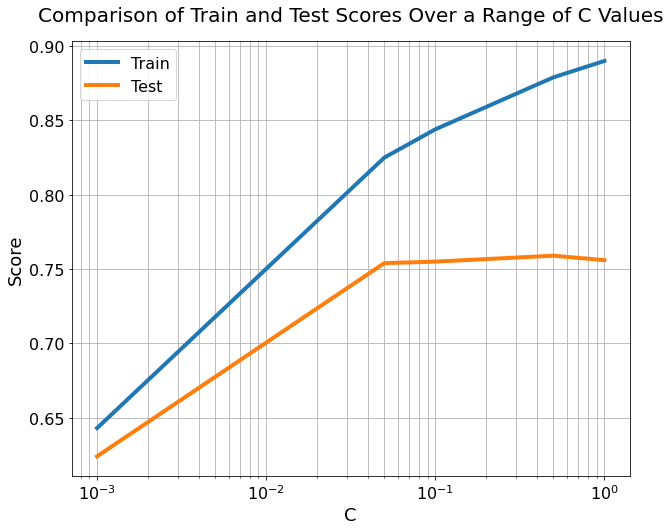

In [40]:
plot_comparison(C_list, train_scores_count, test_scores_count)

Analysis:
- Best Test Accuracy Score is around 0.75, but it comes at a cost of overfitting (training score >= 0.83).
- The model begins to show a sign of overfitting when C >=0.05, so it's recommended to use C = 0.001.
- However, using the C value of 0.001 results in the lowest accuracy score of around 0.62.

#### Best Hyperparameter for Logistic Regression Model using Count Vector: C = 0.001, Accuacy = 0.62

### Testing the Count Vector Model using SVM


Showing results for Svm Model, C = 0.001


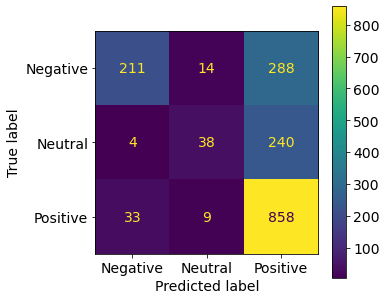

Classification Report: 
               precision    recall  f1-score   support

          -1       0.85      0.41      0.55       513
           0       0.62      0.13      0.22       282
           1       0.62      0.95      0.75       900

    accuracy                           0.65      1695
   macro avg       0.70      0.50      0.51      1695
weighted avg       0.69      0.65      0.60      1695

Training Accuarcy: 0.658
Test Accuracy 0.653

Showing results for Svm Model, C = 0.05


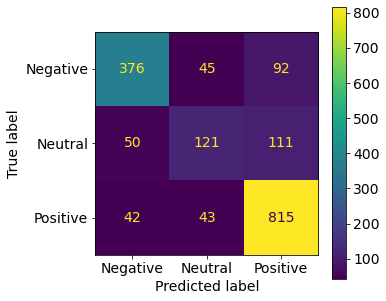

Classification Report: 
               precision    recall  f1-score   support

          -1       0.80      0.73      0.77       513
           0       0.58      0.43      0.49       282
           1       0.80      0.91      0.85       900

    accuracy                           0.77      1695
   macro avg       0.73      0.69      0.70      1695
weighted avg       0.76      0.77      0.77      1695

Training Accuarcy: 0.862
Test Accuracy 0.774

Showing results for Svm Model, C = 0.1


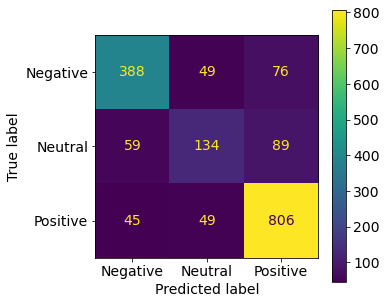

Classification Report: 
               precision    recall  f1-score   support

          -1       0.79      0.76      0.77       513
           0       0.58      0.48      0.52       282
           1       0.83      0.90      0.86       900

    accuracy                           0.78      1695
   macro avg       0.73      0.71      0.72      1695
weighted avg       0.78      0.78      0.78      1695

Training Accuarcy: 0.883
Test Accuracy 0.783

Showing results for Svm Model, C = 0.5


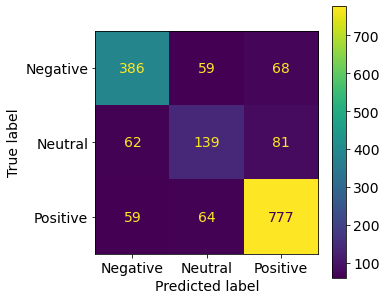

Classification Report: 
               precision    recall  f1-score   support

          -1       0.76      0.75      0.76       513
           0       0.53      0.49      0.51       282
           1       0.84      0.86      0.85       900

    accuracy                           0.77      1695
   macro avg       0.71      0.70      0.71      1695
weighted avg       0.76      0.77      0.77      1695

Training Accuarcy: 0.917
Test Accuracy 0.768

Showing results for Svm Model, C = 1


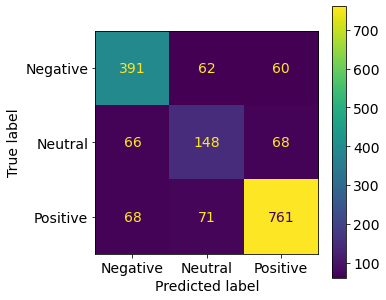

Classification Report: 
               precision    recall  f1-score   support

          -1       0.74      0.76      0.75       513
           0       0.53      0.52      0.53       282
           1       0.86      0.85      0.85       900

    accuracy                           0.77      1695
   macro avg       0.71      0.71      0.71      1695
weighted avg       0.77      0.77      0.77      1695

Training Accuarcy: 0.931
Test Accuracy 0.767


In [41]:
C_list = [0.001, 0.05, 0.1, 0.5, 1]

train_scores_count = []
test_scores_count = []

for C in C_list:
    train_score, test_score, _, _ = get_vector_model(X, y, C = C, model = "svm")
    
    train_scores_count.append(train_score)
    test_scores_count.append(test_score)

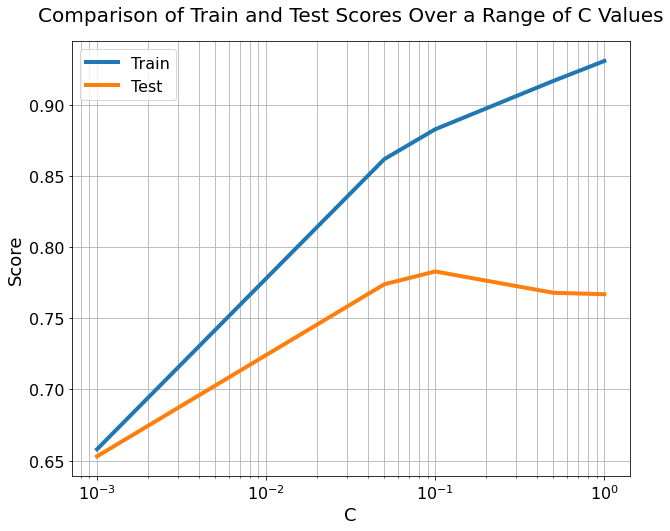

In [42]:
plot_comparison(C_list, train_scores_count, test_scores_count)

Analysis:
- Best Test Accuracy Score: 0.769
- Similar to what we have seen with logistic regression model, the best C value that does not result in overfitting is 0.001 or less. This gives the lowest accuracy score of 0.644.

#### Best Hyperparameter for SVM Model using Count Vector: C = 0.001, Accuacy = 0.66

### Testing the Count Vector Model using Gaussian Naive Bayesian Model


Showing results for Nb Model, C = 1


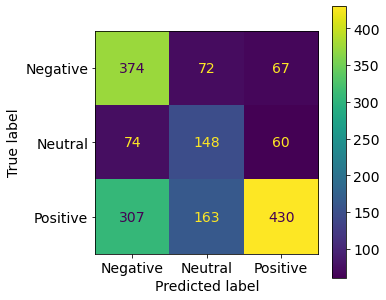

Classification Report: 
               precision    recall  f1-score   support

          -1       0.50      0.73      0.59       513
           0       0.39      0.52      0.45       282
           1       0.77      0.48      0.59       900

    accuracy                           0.56      1695
   macro avg       0.55      0.58      0.54      1695
weighted avg       0.62      0.56      0.57      1695

Training Accuarcy: 0.605
Test Accuracy 0.562


In [43]:

train_score, test_score, _, _ = get_vector_model(X, y, model = "nb") 
## There is no C hyperparameter for NB, so we will skip


Analysis:
- Best Test Accuracy Score: 0.569
- The NB model has performed worse than other two classifiers.

#### Best Test Accuracy Score for Gaussian NB Model using Count Vector: Accuracy = 0.57

### B. TF-IDF

### Testing TF-IDF Model using Log Regression Model


Showing results for Log Model, C = 0.001


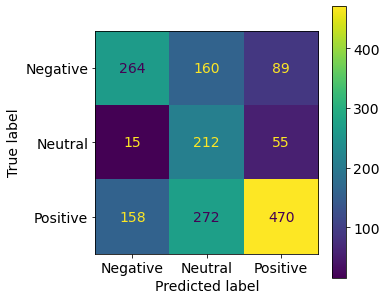

Classification Report: 
               precision    recall  f1-score   support

          -1       0.60      0.51      0.56       513
           0       0.33      0.75      0.46       282
           1       0.77      0.52      0.62       900

    accuracy                           0.56      1695
   macro avg       0.57      0.60      0.54      1695
weighted avg       0.64      0.56      0.57      1695

Training Accuarcy: 0.571
Test Accuracy 0.558

Showing results for Log Model, C = 0.05


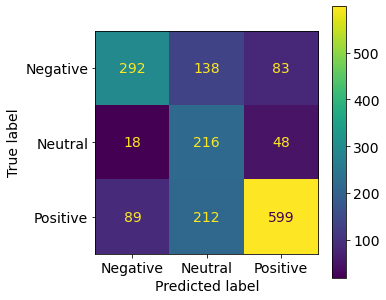

Classification Report: 
               precision    recall  f1-score   support

          -1       0.73      0.57      0.64       513
           0       0.38      0.77      0.51       282
           1       0.82      0.67      0.73       900

    accuracy                           0.65      1695
   macro avg       0.64      0.67      0.63      1695
weighted avg       0.72      0.65      0.67      1695

Training Accuarcy: 0.686
Test Accuracy 0.653

Showing results for Log Model, C = 0.1


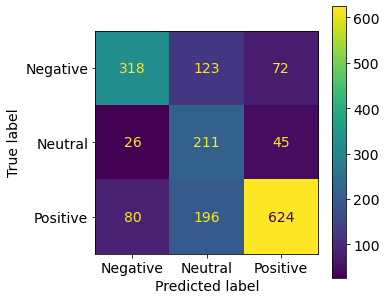

Classification Report: 
               precision    recall  f1-score   support

          -1       0.75      0.62      0.68       513
           0       0.40      0.75      0.52       282
           1       0.84      0.69      0.76       900

    accuracy                           0.68      1695
   macro avg       0.66      0.69      0.65      1695
weighted avg       0.74      0.68      0.70      1695

Training Accuarcy: 0.722
Test Accuracy 0.680

Showing results for Log Model, C = 0.5


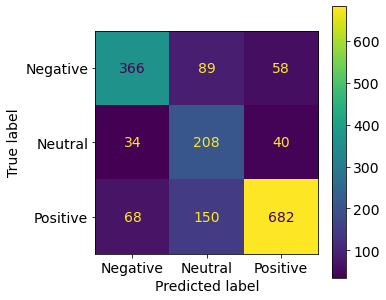

Classification Report: 
               precision    recall  f1-score   support

          -1       0.78      0.71      0.75       513
           0       0.47      0.74      0.57       282
           1       0.87      0.76      0.81       900

    accuracy                           0.74      1695
   macro avg       0.71      0.74      0.71      1695
weighted avg       0.78      0.74      0.75      1695

Training Accuarcy: 0.802
Test Accuracy 0.741

Showing results for Log Model, C = 1


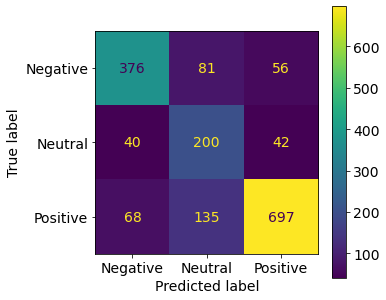

Classification Report: 
               precision    recall  f1-score   support

          -1       0.78      0.73      0.75       513
           0       0.48      0.71      0.57       282
           1       0.88      0.77      0.82       900

    accuracy                           0.75      1695
   macro avg       0.71      0.74      0.72      1695
weighted avg       0.78      0.75      0.76      1695

Training Accuarcy: 0.832
Test Accuracy 0.751


In [44]:
C_list = [0.001, 0.05, 0.1, 0.5, 1]

train_scores_count = []
test_scores_count = []

for C in C_list:
    train_score, test_score, _, _ = get_vector_model(X, y, C = C, v_name = "tfidf")
    
    train_scores_count.append(train_score)
    test_scores_count.append(test_score)

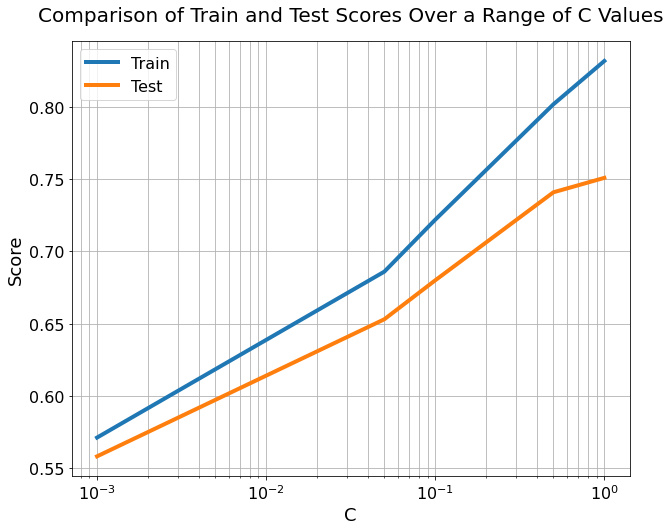

In [45]:
plot_comparison(C_list, train_scores_count, test_scores_count)

Analysis:
- Best Test Accuracy Score = 0.743
- Overall, TF-IDF model scored higher than the Count Vector model.
- There is less overfitting compared to Count Vector model. However, there is an increase in overfitting when C > 0.1.
- It is recommended to use C = 0.1 for the optimum accuracy and balance in overfitting.

#### Best Hyperparameter for Log Regression Model using TF-IDF: C = 0.1, Accuacy = 0.68

### Testing TF-IDF Model using SVM Model


Showing results for Svm Model, C = 0.001


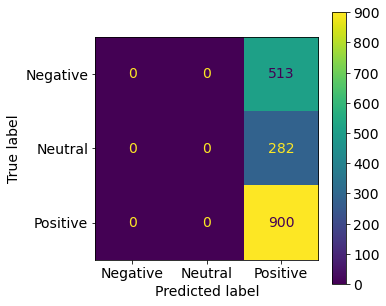

Classification Report: 
               precision    recall  f1-score   support

          -1       0.00      0.00      0.00       513
           0       0.00      0.00      0.00       282
           1       0.53      1.00      0.69       900

    accuracy                           0.53      1695
   macro avg       0.18      0.33      0.23      1695
weighted avg       0.28      0.53      0.37      1695

Training Accuarcy: 0.543
Test Accuracy 0.531


/Users/chang-joonlee/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chang-joonlee/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chang-joonlee/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(resu


Showing results for Svm Model, C = 0.05


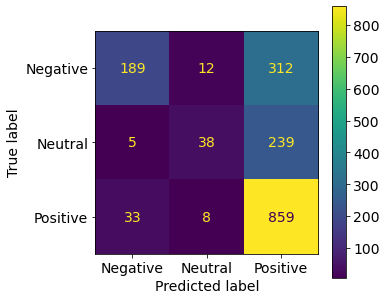

Classification Report: 
               precision    recall  f1-score   support

          -1       0.83      0.37      0.51       513
           0       0.66      0.13      0.22       282
           1       0.61      0.95      0.74       900

    accuracy                           0.64      1695
   macro avg       0.70      0.49      0.49      1695
weighted avg       0.68      0.64      0.59      1695

Training Accuarcy: 0.659
Test Accuracy 0.641

Showing results for Svm Model, C = 0.1


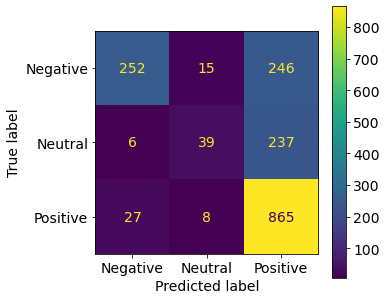

Classification Report: 
               precision    recall  f1-score   support

          -1       0.88      0.49      0.63       513
           0       0.63      0.14      0.23       282
           1       0.64      0.96      0.77       900

    accuracy                           0.68      1695
   macro avg       0.72      0.53      0.54      1695
weighted avg       0.71      0.68      0.64      1695

Training Accuarcy: 0.698
Test Accuracy 0.682

Showing results for Svm Model, C = 0.5


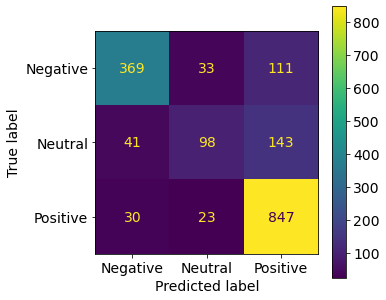

Classification Report: 
               precision    recall  f1-score   support

          -1       0.84      0.72      0.77       513
           0       0.64      0.35      0.45       282
           1       0.77      0.94      0.85       900

    accuracy                           0.78      1695
   macro avg       0.75      0.67      0.69      1695
weighted avg       0.77      0.78      0.76      1695

Training Accuarcy: 0.828
Test Accuracy 0.775

Showing results for Svm Model, C = 1


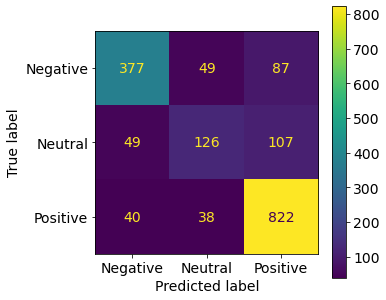

Classification Report: 
               precision    recall  f1-score   support

          -1       0.81      0.73      0.77       513
           0       0.59      0.45      0.51       282
           1       0.81      0.91      0.86       900

    accuracy                           0.78      1695
   macro avg       0.74      0.70      0.71      1695
weighted avg       0.77      0.78      0.77      1695

Training Accuarcy: 0.856
Test Accuracy 0.782


In [46]:
C_list = [0.001, 0.05, 0.1, 0.5, 1]

train_scores_count = []
test_scores_count = []

for C in C_list:
    train_score, test_score, _, _ = get_vector_model(X, y, C = C, model = "svm", v_name = "tfidf")
    
    train_scores_count.append(train_score)
    test_scores_count.append(test_score)

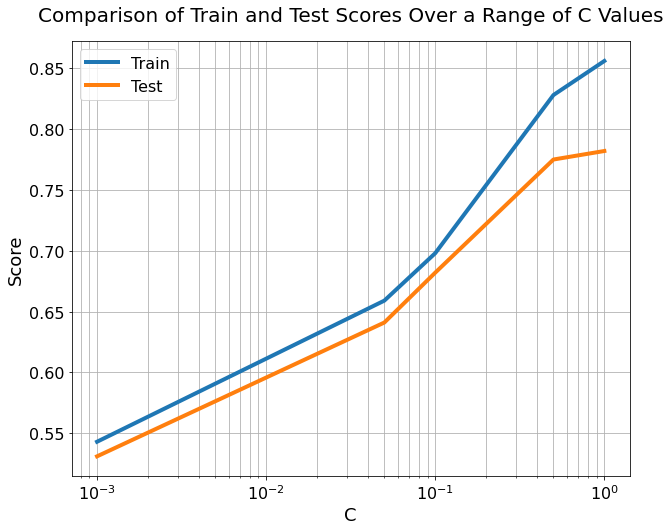

In [47]:
plot_comparison(C_list, train_scores_count, test_scores_count)

Analysis:
- Best Test Accuracy Score: 0.769
- There is less overfitting compared to logistic model using the same TF-IDF vectorisation. However, overfitting becomes worse when C > 0.1.
- There is slight overfitting at C = 0.5, but it give the best test score (0.758) with only a reasonable degree of overfitting.
- When the C value is too low, the model fails to predict neutral class, which had the lowest representation in the dataset.

#### Best Hyperparameter for SVM Model using TF-IDF: C = 0.5, Accuacy = 0.78

### Testing TF-IDF Model using Gaussian Model


Showing results for Nb Model, C = 1


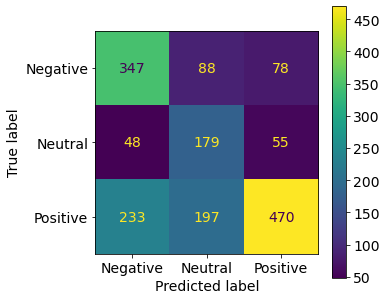

Classification Report: 
               precision    recall  f1-score   support

          -1       0.55      0.68      0.61       513
           0       0.39      0.63      0.48       282
           1       0.78      0.52      0.63       900

    accuracy                           0.59      1695
   macro avg       0.57      0.61      0.57      1695
weighted avg       0.65      0.59      0.60      1695

Training Accuarcy: 0.636
Test Accuracy 0.588


In [48]:

train_score, test_score, _, _ = get_vector_model(X, y, v_name = "tfidf", model = "nb") 
## There is no C hyperparameter for NB, so we will skip

Analysis:
- Best Test Accuracy: 0.583
- Again, performed worse than the other two models.
- However, TF-IDF NB model performed better than the Count Vector NB model.

#### Best Score for NB Model using TF-IDF: Accuacy = 0.58

### C. Word2Vec

In [49]:
# !pip install --upgrade gensim

In [50]:
## Helper function for automating building the model
def get_w2v_model(df, model = "log", C = 1, vs = 100, window = 5, mc = 2, rs = 1):
    ## Clean the data using gensim cleaning function
    df['shorts_clean'] = df['shorts'].apply(lambda x: gensim.utils.simple_preprocess(x))
    
    # Features and Labels
    X = df['shorts_clean']
    y = df['class']
    
    # split the dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = rs)
    
    # create a classifier 
    if model == "log":
        clf = LogisticRegression(n_jobs=1, C = C, max_iter = 10000, class_weight="balanced")
    elif model == "svm":   
        clf = SVC(kernel='linear', probability=True, C = C, gamma = "auto")
    else:
        clf = GaussianNB()
        
        # W2V
    # Train the word2vec model
    w2v_model = Word2Vec(X_train,
                         vector_size=vs, ## Size of the Vector
                         window=window, ## Number words before and after the focus word that it’ll consider as context for the word
                         min_count=mc) ## The number of times a word must appear in our corpus in order to create a word vector
        
    
    ## Transform the data using w2v
    words = set(w2v_model.wv.index_to_key )

    X_train_vect = [np.array([w2v_model.wv[i] for i in ls if i in words]) for ls in X_train]
    X_test_vect = [np.array([w2v_model.wv[i] for i in ls if i in words]) for ls in X_test]
    
    # Compute sentence vectors by averaging the word vectors for the words contained in the sentence
    A = []
    for v in X_train_vect:
        if v.size:
            A.append(v.mean(axis=0))
        else:
            A.append(np.zeros(100, dtype=float))
            
    B = []
    for v in X_test_vect:
        if v.size:
            B.append(v.mean(axis=0))
        else:
            B.append(np.zeros(100, dtype=float))
        
    # train the classifier with the training data
    if model == "nb":
        clf.fit(A, y_train)
        train_score = clf.score(A, y_train)
    else:
        clf.fit(A, y_train)
        train_score = clf.score(A, y_train)
    
#       cv_score = np.mean(cross_val_score(clf, A.toarray(), y_train, cv=3))
#       print(f"Mean Cross-Validation Score: %.3f" % cv_score)
    
    if model == "nb":
        pred = clf.predict(B)
        prob = clf.predict_proba(B)
    else:
        pred = clf.predict(B)
        prob = clf.predict_proba(B)
    
    test_score = accuracy_score(y_test, pred)
    
    print(f"\nShowing results for {model.title()} Model, C = {C}")
    
    show_summary_report(y_test, pred, prob)
    
    print(f"Training Accuarcy: %.3f" % train_score)
    print('Test Accuracy %.3f' % test_score)
    
    return round(train_score, 3), round(test_score, 3), clf     


Showing results for Log Model, C = 1


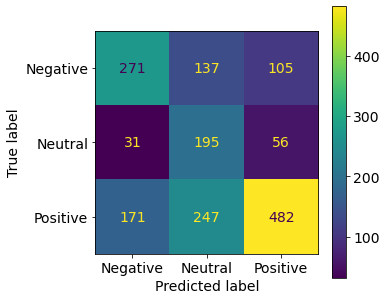

Classification Report: 
               precision    recall  f1-score   support

          -1       0.57      0.53      0.55       513
           0       0.34      0.69      0.45       282
           1       0.75      0.54      0.62       900

    accuracy                           0.56      1695
   macro avg       0.55      0.59      0.54      1695
weighted avg       0.63      0.56      0.57      1695

Training Accuarcy: 0.575
Test Accuracy 0.559


In [51]:
train_score, test_score, _ = get_w2v_model(df, C = 1)

In [52]:
vs_list = [10, 50, 100, 200, 500, 1000]
window_list = [1, 2, 5, 10, 20]
mc_list = [2, 3, 4, 5]


Training 10

Showing results for Log Model, C = 0.1


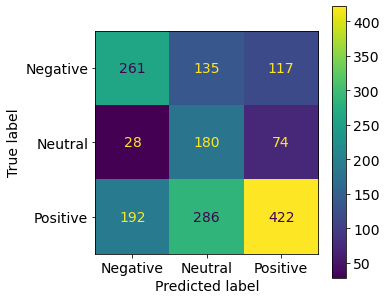

Classification Report: 
               precision    recall  f1-score   support

          -1       0.54      0.51      0.53       513
           0       0.30      0.64      0.41       282
           1       0.69      0.47      0.56       900

    accuracy                           0.51      1695
   macro avg       0.51      0.54      0.50      1695
weighted avg       0.58      0.51      0.52      1695

Training Accuarcy: 0.520
Test Accuracy 0.509

Training 50

Showing results for Log Model, C = 0.1


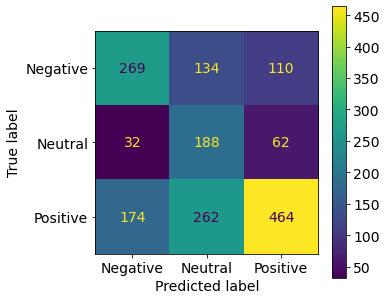

Classification Report: 
               precision    recall  f1-score   support

          -1       0.57      0.52      0.54       513
           0       0.32      0.67      0.43       282
           1       0.73      0.52      0.60       900

    accuracy                           0.54      1695
   macro avg       0.54      0.57      0.53      1695
weighted avg       0.61      0.54      0.56      1695

Training Accuarcy: 0.551
Test Accuracy 0.543

Training 100

Showing results for Log Model, C = 0.1


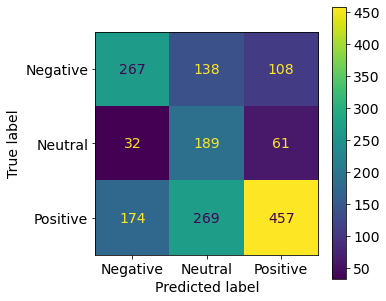

Classification Report: 
               precision    recall  f1-score   support

          -1       0.56      0.52      0.54       513
           0       0.32      0.67      0.43       282
           1       0.73      0.51      0.60       900

    accuracy                           0.54      1695
   macro avg       0.54      0.57      0.52      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.549
Test Accuracy 0.539

Training 200

Showing results for Log Model, C = 0.1


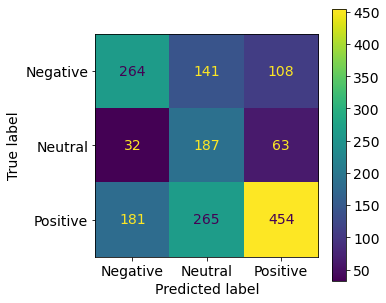

Classification Report: 
               precision    recall  f1-score   support

          -1       0.55      0.51      0.53       513
           0       0.32      0.66      0.43       282
           1       0.73      0.50      0.60       900

    accuracy                           0.53      1695
   macro avg       0.53      0.56      0.52      1695
weighted avg       0.61      0.53      0.55      1695

Training Accuarcy: 0.542
Test Accuracy 0.534

Training 500

Showing results for Log Model, C = 0.1


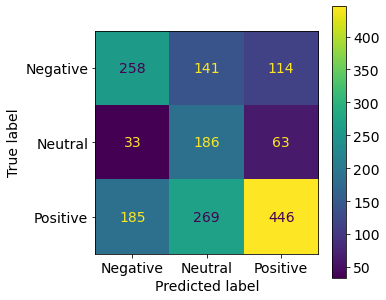

Classification Report: 
               precision    recall  f1-score   support

          -1       0.54      0.50      0.52       513
           0       0.31      0.66      0.42       282
           1       0.72      0.50      0.59       900

    accuracy                           0.53      1695
   macro avg       0.52      0.55      0.51      1695
weighted avg       0.60      0.53      0.54      1695

Training Accuarcy: 0.539
Test Accuracy 0.525

Training 1000

Showing results for Log Model, C = 0.1


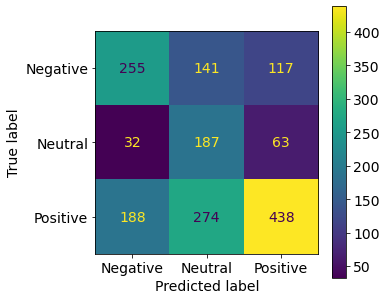

Classification Report: 
               precision    recall  f1-score   support

          -1       0.54      0.50      0.52       513
           0       0.31      0.66      0.42       282
           1       0.71      0.49      0.58       900

    accuracy                           0.52      1695
   macro avg       0.52      0.55      0.51      1695
weighted avg       0.59      0.52      0.53      1695

Training Accuarcy: 0.535
Test Accuracy 0.519


In [53]:
## Testing for vector size
train_scores = []
test_scores = []

for vs in vs_list:
    print(f"\nTraining {vs}")
    train_score, test_score, _ = get_w2v_model(df, model = "log", C = 0.1, vs = vs)
    
    train_scores.append(train_score)
    test_scores.append(test_score)

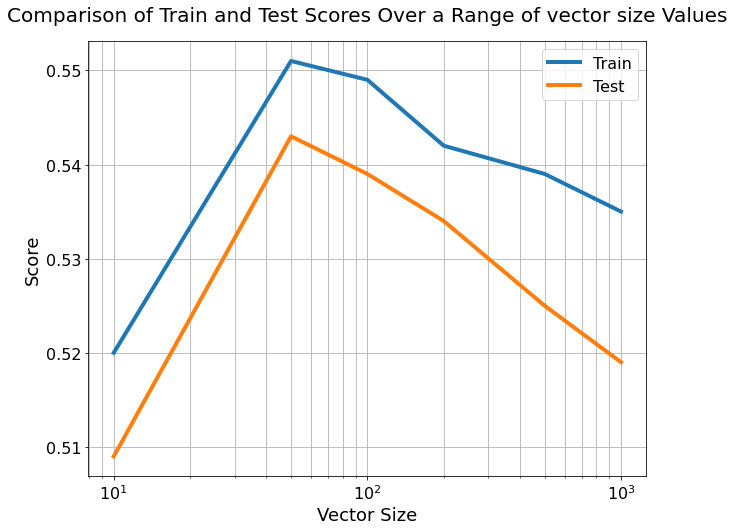

In [54]:
plot_comparison(vs_list, train_scores, test_scores, name = "vector size")

Analysis:
- Using vector size of 100 gave the best performance.


Training 1

Showing results for Log Model, C = 0.1


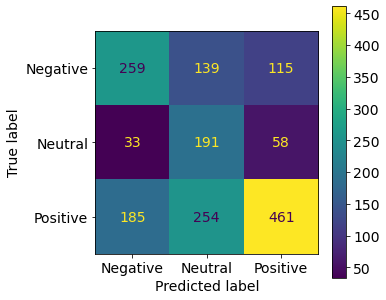

Classification Report: 
               precision    recall  f1-score   support

          -1       0.54      0.50      0.52       513
           0       0.33      0.68      0.44       282
           1       0.73      0.51      0.60       900

    accuracy                           0.54      1695
   macro avg       0.53      0.56      0.52      1695
weighted avg       0.60      0.54      0.55      1695

Training Accuarcy: 0.553
Test Accuracy 0.537

Training 2

Showing results for Log Model, C = 0.1


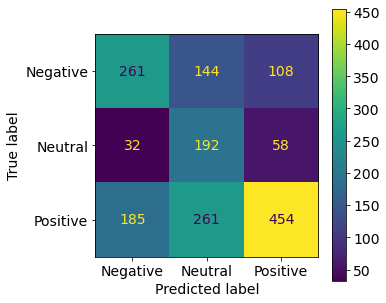

Classification Report: 
               precision    recall  f1-score   support

          -1       0.55      0.51      0.53       513
           0       0.32      0.68      0.44       282
           1       0.73      0.50      0.60       900

    accuracy                           0.54      1695
   macro avg       0.53      0.56      0.52      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.553
Test Accuracy 0.535

Training 5

Showing results for Log Model, C = 0.1


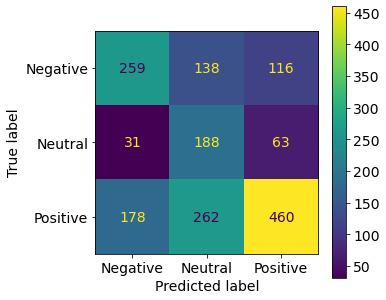

Classification Report: 
               precision    recall  f1-score   support

          -1       0.55      0.50      0.53       513
           0       0.32      0.67      0.43       282
           1       0.72      0.51      0.60       900

    accuracy                           0.54      1695
   macro avg       0.53      0.56      0.52      1695
weighted avg       0.60      0.54      0.55      1695

Training Accuarcy: 0.546
Test Accuracy 0.535

Training 10

Showing results for Log Model, C = 0.1


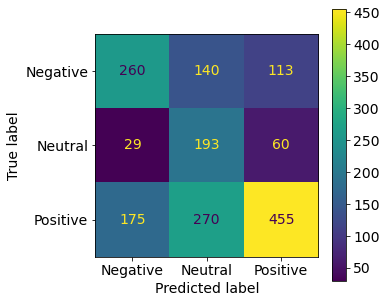

Classification Report: 
               precision    recall  f1-score   support

          -1       0.56      0.51      0.53       513
           0       0.32      0.68      0.44       282
           1       0.72      0.51      0.60       900

    accuracy                           0.54      1695
   macro avg       0.53      0.57      0.52      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.547
Test Accuracy 0.536

Training 20

Showing results for Log Model, C = 0.1


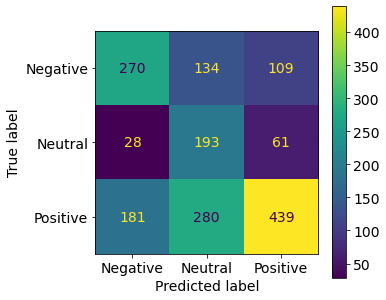

Classification Report: 
               precision    recall  f1-score   support

          -1       0.56      0.53      0.54       513
           0       0.32      0.68      0.43       282
           1       0.72      0.49      0.58       900

    accuracy                           0.53      1695
   macro avg       0.53      0.57      0.52      1695
weighted avg       0.61      0.53      0.55      1695

Training Accuarcy: 0.548
Test Accuracy 0.532


In [55]:
## Testing for window
train_scores = []
test_scores = []

for window in window_list:
    print(f"\nTraining {window}")
    train_score, test_score, _ = get_w2v_model(df, model = "log", C = 0.1, window = window)
    
    train_scores.append(train_score)
    test_scores.append(test_score)

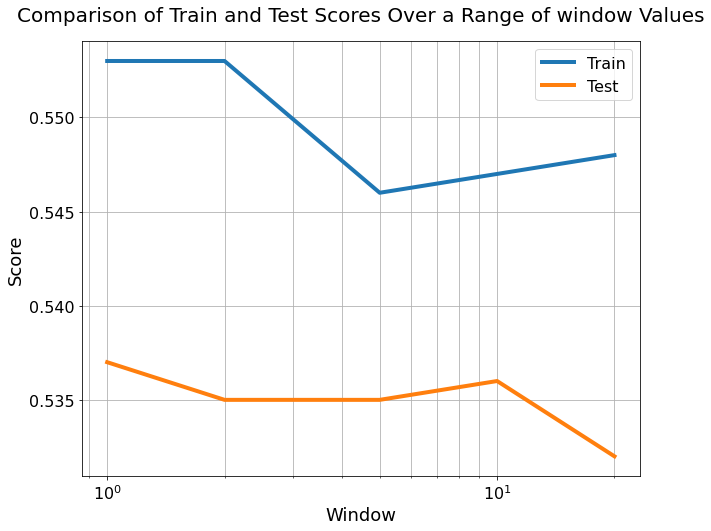

In [56]:
plot_comparison(window_list, train_scores, test_scores, name = "window")

Analysis:
- Window size did not make significant difference.
- Window size of 5 gave the result with least overfitting.


Training 2

Showing results for Log Model, C = 0.1


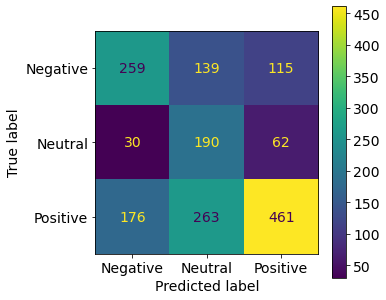

Classification Report: 
               precision    recall  f1-score   support

          -1       0.56      0.50      0.53       513
           0       0.32      0.67      0.43       282
           1       0.72      0.51      0.60       900

    accuracy                           0.54      1695
   macro avg       0.53      0.56      0.52      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.547
Test Accuracy 0.537

Training 3

Showing results for Log Model, C = 0.1


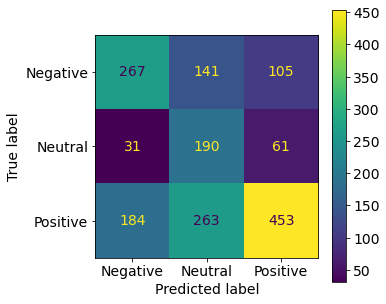

Classification Report: 
               precision    recall  f1-score   support

          -1       0.55      0.52      0.54       513
           0       0.32      0.67      0.43       282
           1       0.73      0.50      0.60       900

    accuracy                           0.54      1695
   macro avg       0.54      0.57      0.52      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.549
Test Accuracy 0.537

Training 4

Showing results for Log Model, C = 0.1


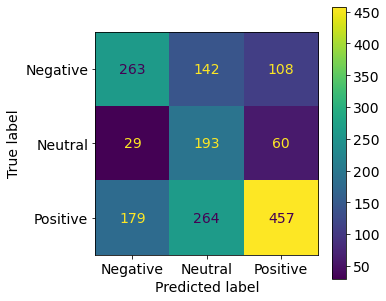

Classification Report: 
               precision    recall  f1-score   support

          -1       0.56      0.51      0.53       513
           0       0.32      0.68      0.44       282
           1       0.73      0.51      0.60       900

    accuracy                           0.54      1695
   macro avg       0.54      0.57      0.52      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.551
Test Accuracy 0.539

Training 5

Showing results for Log Model, C = 0.1


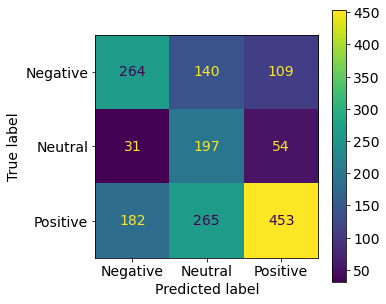

Classification Report: 
               precision    recall  f1-score   support

          -1       0.55      0.51      0.53       513
           0       0.33      0.70      0.45       282
           1       0.74      0.50      0.60       900

    accuracy                           0.54      1695
   macro avg       0.54      0.57      0.53      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.553
Test Accuracy 0.539


In [57]:
train_scores = []
test_scores = []

for mc in mc_list:
    print(f"\nTraining {mc}")
    train_score, test_score, _ = get_w2v_model(df, model = "log", C = 0.1, mc = mc)
    
    train_scores.append(train_score)
    test_scores.append(test_score)

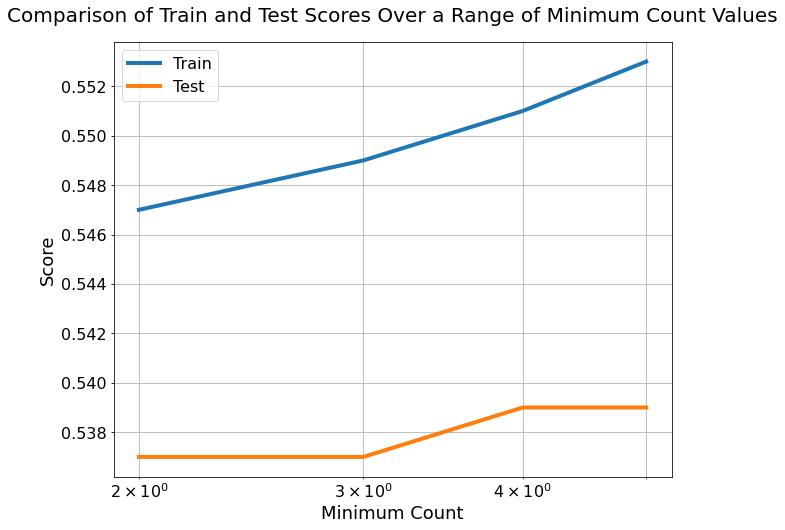

In [58]:
plot_comparison(mc_list, train_scores, test_scores, name = "Minimum Count")

Analysis:
- Minimum count did not make significant difference.
- Minimum count of 2 gave the result with least overfitting.

### Testing Word2Vec Model using Log Regression Model


Showing results for Log Model, C = 0.001


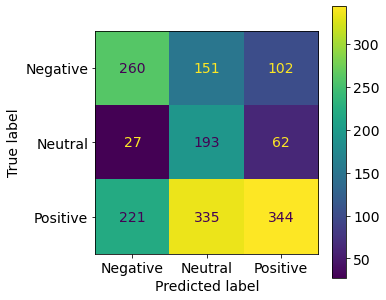

Classification Report: 
               precision    recall  f1-score   support

          -1       0.51      0.51      0.51       513
           0       0.28      0.68      0.40       282
           1       0.68      0.38      0.49       900

    accuracy                           0.47      1695
   macro avg       0.49      0.52      0.47      1695
weighted avg       0.56      0.47      0.48      1695

Training Accuarcy: 0.473
Test Accuracy 0.470

Showing results for Log Model, C = 0.05


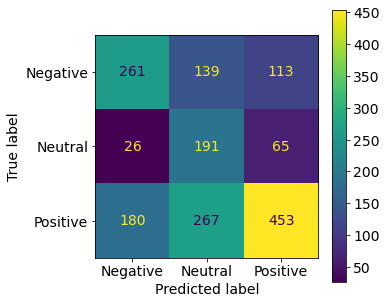

Classification Report: 
               precision    recall  f1-score   support

          -1       0.56      0.51      0.53       513
           0       0.32      0.68      0.43       282
           1       0.72      0.50      0.59       900

    accuracy                           0.53      1695
   macro avg       0.53      0.56      0.52      1695
weighted avg       0.60      0.53      0.55      1695

Training Accuarcy: 0.541
Test Accuracy 0.534

Showing results for Log Model, C = 0.1


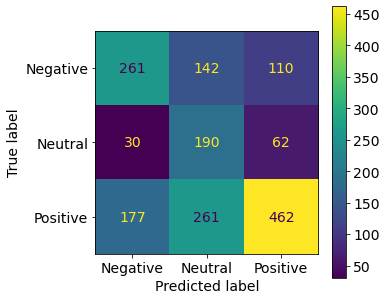

Classification Report: 
               precision    recall  f1-score   support

          -1       0.56      0.51      0.53       513
           0       0.32      0.67      0.43       282
           1       0.73      0.51      0.60       900

    accuracy                           0.54      1695
   macro avg       0.54      0.57      0.52      1695
weighted avg       0.61      0.54      0.55      1695

Training Accuarcy: 0.547
Test Accuracy 0.539

Showing results for Log Model, C = 0.5


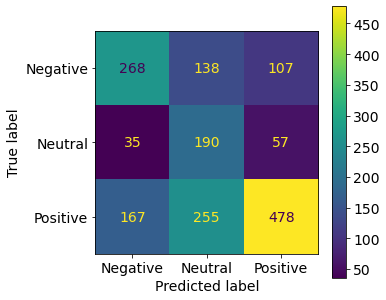

Classification Report: 
               precision    recall  f1-score   support

          -1       0.57      0.52      0.55       513
           0       0.33      0.67      0.44       282
           1       0.74      0.53      0.62       900

    accuracy                           0.55      1695
   macro avg       0.55      0.58      0.53      1695
weighted avg       0.62      0.55      0.57      1695

Training Accuarcy: 0.573
Test Accuracy 0.552

Showing results for Log Model, C = 1


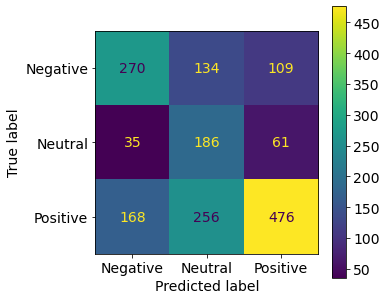

Classification Report: 
               precision    recall  f1-score   support

          -1       0.57      0.53      0.55       513
           0       0.32      0.66      0.43       282
           1       0.74      0.53      0.62       900

    accuracy                           0.55      1695
   macro avg       0.54      0.57      0.53      1695
weighted avg       0.62      0.55      0.56      1695

Training Accuarcy: 0.575
Test Accuracy 0.550

Showing results for Log Model, C = 5


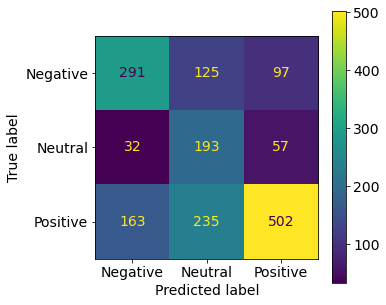

Classification Report: 
               precision    recall  f1-score   support

          -1       0.60      0.57      0.58       513
           0       0.35      0.68      0.46       282
           1       0.77      0.56      0.65       900

    accuracy                           0.58      1695
   macro avg       0.57      0.60      0.56      1695
weighted avg       0.65      0.58      0.60      1695

Training Accuarcy: 0.594
Test Accuracy 0.582

Showing results for Log Model, C = 10


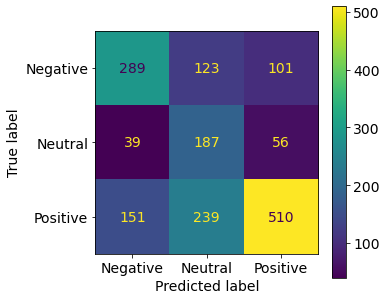

Classification Report: 
               precision    recall  f1-score   support

          -1       0.60      0.56      0.58       513
           0       0.34      0.66      0.45       282
           1       0.76      0.57      0.65       900

    accuracy                           0.58      1695
   macro avg       0.57      0.60      0.56      1695
weighted avg       0.65      0.58      0.60      1695

Training Accuarcy: 0.603
Test Accuracy 0.582

Showing results for Log Model, C = 50


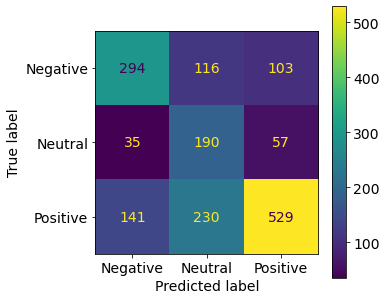

Classification Report: 
               precision    recall  f1-score   support

          -1       0.63      0.57      0.60       513
           0       0.35      0.67      0.46       282
           1       0.77      0.59      0.67       900

    accuracy                           0.60      1695
   macro avg       0.58      0.61      0.58      1695
weighted avg       0.66      0.60      0.61      1695

Training Accuarcy: 0.627
Test Accuracy 0.598

Showing results for Log Model, C = 100


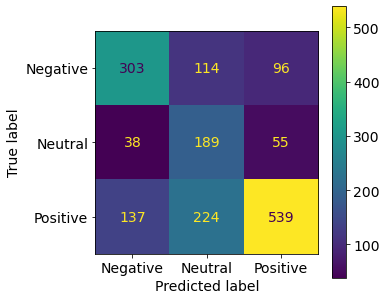

Classification Report: 
               precision    recall  f1-score   support

          -1       0.63      0.59      0.61       513
           0       0.36      0.67      0.47       282
           1       0.78      0.60      0.68       900

    accuracy                           0.61      1695
   macro avg       0.59      0.62      0.59      1695
weighted avg       0.67      0.61      0.62      1695

Training Accuarcy: 0.634
Test Accuracy 0.608

Showing results for Log Model, C = 500


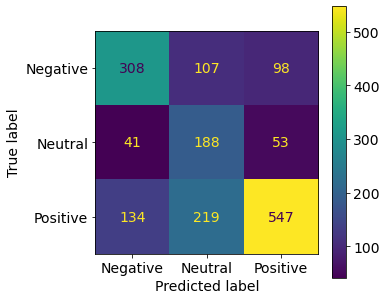

Classification Report: 
               precision    recall  f1-score   support

          -1       0.64      0.60      0.62       513
           0       0.37      0.67      0.47       282
           1       0.78      0.61      0.68       900

    accuracy                           0.62      1695
   macro avg       0.60      0.62      0.59      1695
weighted avg       0.67      0.62      0.63      1695

Training Accuarcy: 0.647
Test Accuracy 0.615

Showing results for Log Model, C = 1000


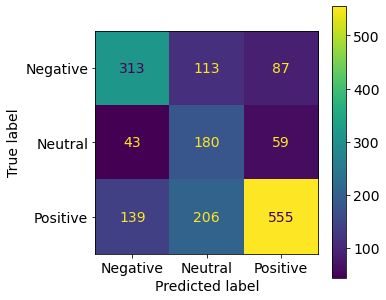

Classification Report: 
               precision    recall  f1-score   support

          -1       0.63      0.61      0.62       513
           0       0.36      0.64      0.46       282
           1       0.79      0.62      0.69       900

    accuracy                           0.62      1695
   macro avg       0.59      0.62      0.59      1695
weighted avg       0.67      0.62      0.63      1695

Training Accuarcy: 0.657
Test Accuracy 0.618


In [59]:
C_list = [0.001, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500, 1000]

train_scores_count = []
test_scores_count = []

for C in C_list:
    train_score, test_score, _ = get_w2v_model(df_copy, C = C)
    
    train_scores_count.append(train_score)
    test_scores_count.append(test_score)

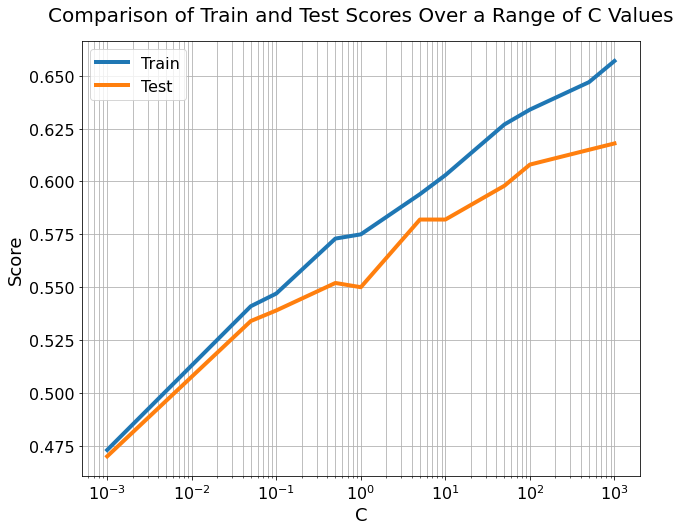

In [60]:
plot_comparison(C_list, train_scores_count, test_scores_count)

Analysis:
- The Word2Vec logistic regression model generally did not perform better than other models using different word vectorisation methods.
- The accuracy of the model increases as we increase the C parameter but at the cost of increase in the extent of overfitting.
- However, for the tested C parameters, the extent of overfitting does not seem to be too severe (the maximum difference in training and test accuracy scores is around 0.3)

#### Best Accuracy Score for Logistic Regression Model with Word2Vec: 0.62, C = 1000

### Testing Word2Vec Model using SVM Model


Showing results for Svm Model, C = 0.001


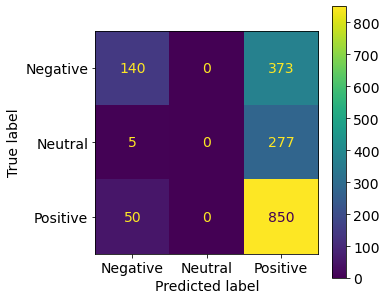

Classification Report: 
               precision    recall  f1-score   support

          -1       0.72      0.27      0.40       513
           0       0.00      0.00      0.00       282
           1       0.57      0.94      0.71       900

    accuracy                           0.58      1695
   macro avg       0.43      0.41      0.37      1695
weighted avg       0.52      0.58      0.50      1695

Training Accuarcy: 0.587
Test Accuracy 0.584


/Users/chang-joonlee/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chang-joonlee/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chang-joonlee/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(resu


Showing results for Svm Model, C = 0.05


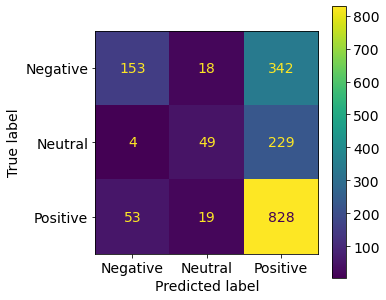

Classification Report: 
               precision    recall  f1-score   support

          -1       0.73      0.30      0.42       513
           0       0.57      0.17      0.27       282
           1       0.59      0.92      0.72       900

    accuracy                           0.61      1695
   macro avg       0.63      0.46      0.47      1695
weighted avg       0.63      0.61      0.55      1695

Training Accuarcy: 0.614
Test Accuracy 0.608

Showing results for Svm Model, C = 0.1


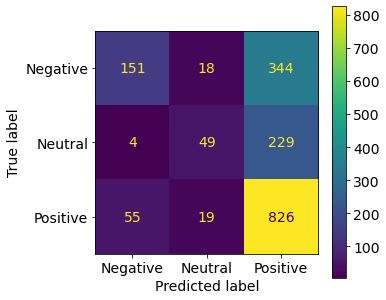

Classification Report: 
               precision    recall  f1-score   support

          -1       0.72      0.29      0.42       513
           0       0.57      0.17      0.27       282
           1       0.59      0.92      0.72       900

    accuracy                           0.61      1695
   macro avg       0.63      0.46      0.47      1695
weighted avg       0.63      0.61      0.55      1695

Training Accuarcy: 0.617
Test Accuracy 0.605

Showing results for Svm Model, C = 0.5


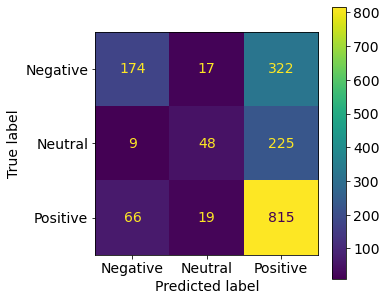

Classification Report: 
               precision    recall  f1-score   support

          -1       0.70      0.34      0.46       513
           0       0.57      0.17      0.26       282
           1       0.60      0.91      0.72       900

    accuracy                           0.61      1695
   macro avg       0.62      0.47      0.48      1695
weighted avg       0.62      0.61      0.56      1695

Training Accuarcy: 0.626
Test Accuracy 0.612

Showing results for Svm Model, C = 1


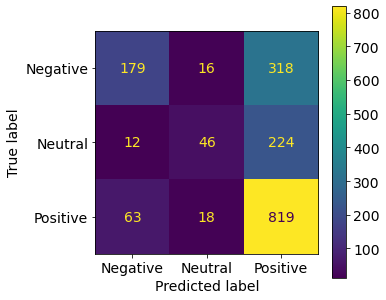

Classification Report: 
               precision    recall  f1-score   support

          -1       0.70      0.35      0.47       513
           0       0.57      0.16      0.25       282
           1       0.60      0.91      0.72       900

    accuracy                           0.62      1695
   macro avg       0.63      0.47      0.48      1695
weighted avg       0.63      0.62      0.57      1695

Training Accuarcy: 0.630
Test Accuracy 0.616

Showing results for Svm Model, C = 5


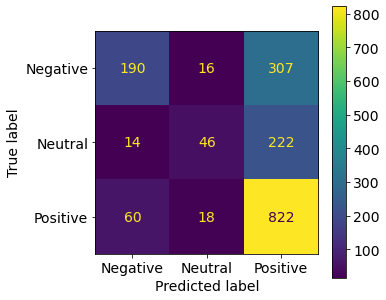

Classification Report: 
               precision    recall  f1-score   support

          -1       0.72      0.37      0.49       513
           0       0.57      0.16      0.25       282
           1       0.61      0.91      0.73       900

    accuracy                           0.62      1695
   macro avg       0.63      0.48      0.49      1695
weighted avg       0.64      0.62      0.58      1695

Training Accuarcy: 0.641
Test Accuracy 0.624

Showing results for Svm Model, C = 10


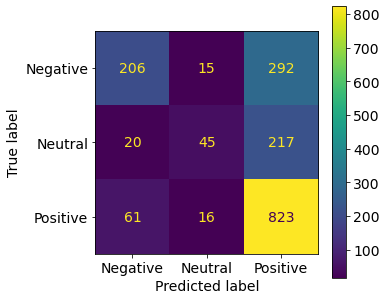

Classification Report: 
               precision    recall  f1-score   support

          -1       0.72      0.40      0.52       513
           0       0.59      0.16      0.25       282
           1       0.62      0.91      0.74       900

    accuracy                           0.63      1695
   macro avg       0.64      0.49      0.50      1695
weighted avg       0.64      0.63      0.59      1695

Training Accuarcy: 0.648
Test Accuracy 0.634

Showing results for Svm Model, C = 50


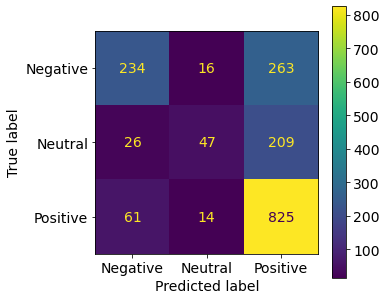

Classification Report: 
               precision    recall  f1-score   support

          -1       0.73      0.46      0.56       513
           0       0.61      0.17      0.26       282
           1       0.64      0.92      0.75       900

    accuracy                           0.65      1695
   macro avg       0.66      0.51      0.52      1695
weighted avg       0.66      0.65      0.61      1695

Training Accuarcy: 0.670
Test Accuracy 0.653

Showing results for Svm Model, C = 100


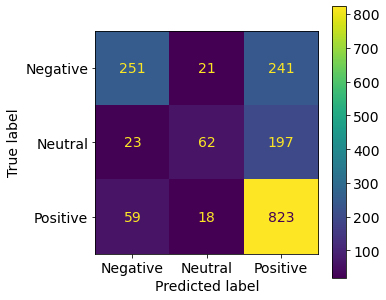

Classification Report: 
               precision    recall  f1-score   support

          -1       0.75      0.49      0.59       513
           0       0.61      0.22      0.32       282
           1       0.65      0.91      0.76       900

    accuracy                           0.67      1695
   macro avg       0.67      0.54      0.56      1695
weighted avg       0.68      0.67      0.64      1695

Training Accuarcy: 0.681
Test Accuracy 0.670

Showing results for Svm Model, C = 500


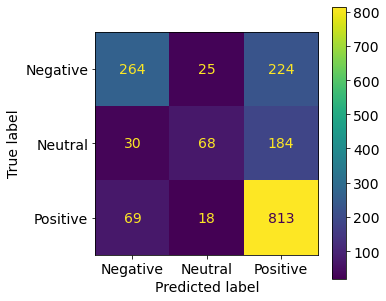

Classification Report: 
               precision    recall  f1-score   support

          -1       0.73      0.51      0.60       513
           0       0.61      0.24      0.35       282
           1       0.67      0.90      0.77       900

    accuracy                           0.68      1695
   macro avg       0.67      0.55      0.57      1695
weighted avg       0.68      0.68      0.65      1695

Training Accuarcy: 0.691
Test Accuracy 0.676

Showing results for Svm Model, C = 1000


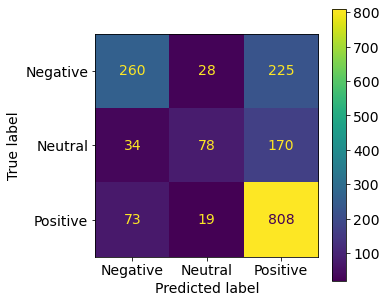

Classification Report: 
               precision    recall  f1-score   support

          -1       0.71      0.51      0.59       513
           0       0.62      0.28      0.38       282
           1       0.67      0.90      0.77       900

    accuracy                           0.68      1695
   macro avg       0.67      0.56      0.58      1695
weighted avg       0.67      0.68      0.65      1695

Training Accuarcy: 0.699
Test Accuracy 0.676


In [61]:
C_list = [0.001, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500, 1000]

train_scores_count = []
test_scores_count = []

for C in C_list:
    train_score, test_score, _ = get_w2v_model(df_copy, model = "svm", C = C)
    
    train_scores_count.append(train_score)
    test_scores_count.append(test_score)

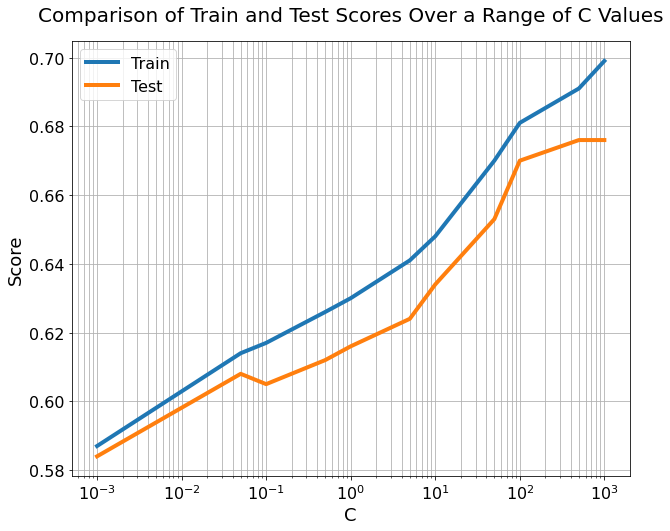

In [62]:
plot_comparison(C_list, train_scores_count, test_scores_count)

Analysis:
- The Word2Vec model seems to be less prone to overfitting compared to other models.
- However, it did not perform as well as TF-IDF model.
- It may be possible thatwe could get a higher score if we increase the C value, but this may come at a higher computational cost.

#### Best Test Score for Word2Vec Model with SVM: 0.68, C = 1000

### Testing Word2Vec Model using Gaussian NB Model


Showing results for Nb Model, C = 1000


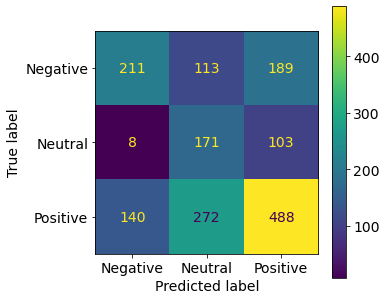

Classification Report: 
               precision    recall  f1-score   support

          -1       0.59      0.41      0.48       513
           0       0.31      0.61      0.41       282
           1       0.63      0.54      0.58       900

    accuracy                           0.51      1695
   macro avg       0.51      0.52      0.49      1695
weighted avg       0.56      0.51      0.52      1695

Training Accuarcy: 0.521
Test Accuracy 0.513


In [63]:
train_score, test_score, _ = get_w2v_model(df_copy, model = "nb", C = C)

Analysis:
- Similar to other vectorisation methods, the Gaussian Naive Bayes Model performed very poorly.

### D. Boosting

Here, we will boost the best models from each vectorisation method:
1. Count Vector - SVM with C = 0.001
2. TF-IDF - SVM with C = 0.5
3. Word2Vec - SVM with C = 1000

### Count Vector SVM, C = 0.001

In [64]:
# Features and Labels
X = df_copy['shorts']
y = df_copy['class']

In [65]:
def boost_model(X, y, clf, model = "svm", v_name = "count", n_est = 1, rate = 1, rs = 1):    
    
    # split the dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = rs)

    # create a matrix of word counts from the text
    if v_name == "count":
        vector = CountVectorizer(max_features=1000, ngram_range=(1, 1))
    else:
        vector = TfidfVectorizer(max_features=1000, ngram_range=(1, 1))
    
    # do the actual counting
    # do the transformation for the test data
    # NOTE: use `transform()` instead of `fit_transform()`
    A = vector.fit_transform(X_train.values.tolist())
    B = vector.transform(X_test)
    
    boosting = AdaBoostClassifier(base_estimator = clf, 
                                  n_estimators = n_est, 
                                  learning_rate = rate, 
                                  random_state = rs)   
    
    boosting.fit(A, y_train)
    train_score = boosting.score(A, y_train)

    pred = boosting.predict(B)
    prob = boosting.predict_proba(B)
    
    test_score = accuracy_score(y_test, pred)
    
    print(f"\nShowing Boosted Results for {model.title()} Model")
    print(f"Training Accuarcy: %.3f" % train_score)
    print('Test Accuracy %.3f' % test_score)
    
    
    return train_score, test_score, boosting


Showing results for Svm Model, C = 0.001


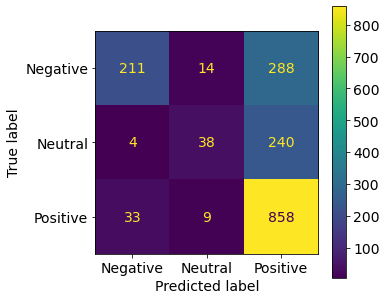

Classification Report: 
               precision    recall  f1-score   support

          -1       0.85      0.41      0.55       513
           0       0.62      0.13      0.22       282
           1       0.62      0.95      0.75       900

    accuracy                           0.65      1695
   macro avg       0.70      0.50      0.51      1695
weighted avg       0.69      0.65      0.60      1695

Training Accuarcy: 0.658
Test Accuracy 0.653


In [68]:
train_score_count, test_score_count, clf_count, _ = get_vector_model(X, y, C = 0.001, model = "svm")

In [69]:

# num_est = [2, 5, 10, 20, 100]
# lr = [0.1, 0.3, 0.5, 1, 2]
# score_dict = {}

# for n_est in num_est: 
#     score_dict[n_est] = []
    
#     for rate in lr:
#         print(f"\nTraining {n_est} Estimators, with Learning Rate = {rate}")
#         train_score, test_score, _ = boost_model(X, y, clf_count, n_est = n_est, rate = rate)
#         score_dict[n_est].append(test_score)

# max_score = 0
# best_lr = 0
# best_n_est = 0

# for key, value in score_dict.items():
#     index = np.argmax(score_dict[key])
#     if max_score <= max(score_dict[key]):
#         max_score = max(score_dict[key])
#         best_lr = lr[index]
#         best_n_est = key
#     else: 
#         max_score = max_score
#         best_lr = best_lr
#         best_n_est = best_n_est

# print("Best Score: %.3f, Best Learning Rate: %.2f, Best Number of Estimators: %d" %(max_score, best_lr, best_n_est))

Please note these codes have been commented out because it took too long to run, so this part of the code was run only once.

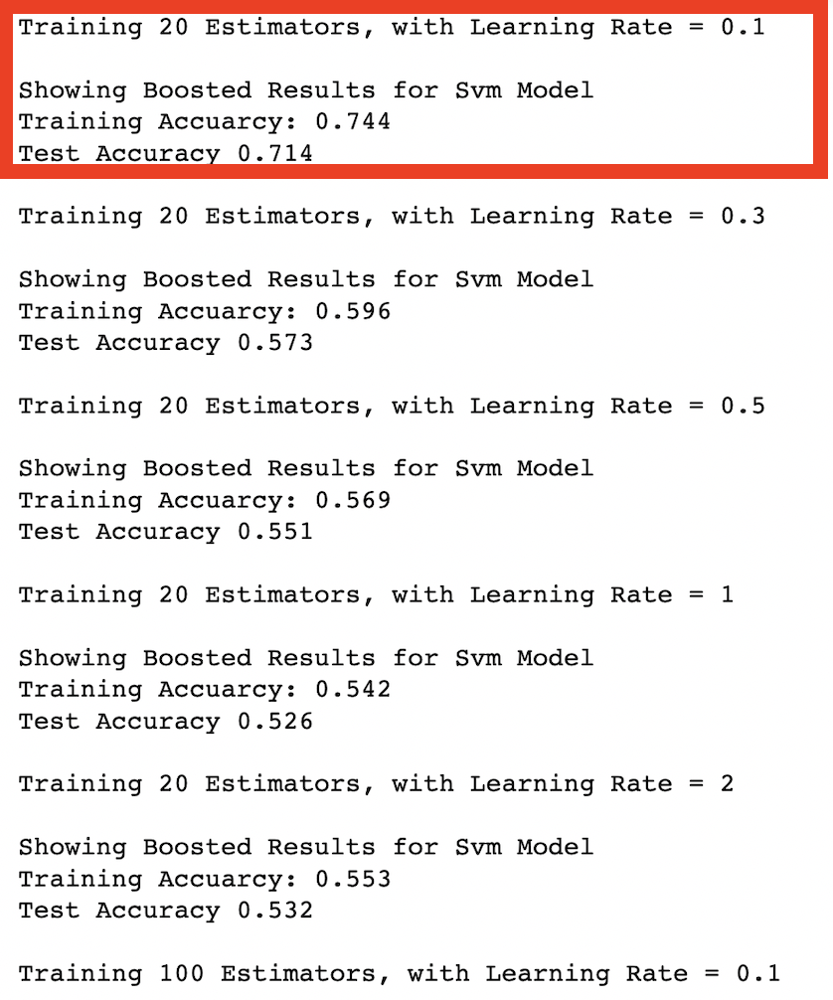

Analysis:
- Best Score: 0.714 with 20 Estimators at learning rate of 0.1.
- Initially tried to use 100 estimators, but had to halt due to time constraint.
- Moving forward, we will only try estimators ranging from 5 to 20 (5, 10, 20), with learning rates ranging from 0.1 to 0.5 to reduce computation time.

### TF-IDF SVM Model, C = 0.5


Showing results for Svm Model, C = 0.5


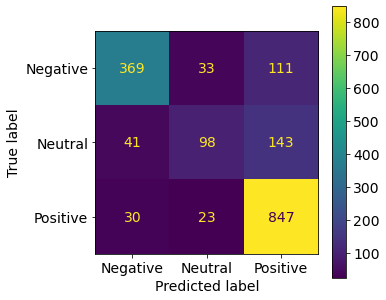

Classification Report: 
               precision    recall  f1-score   support

          -1       0.84      0.72      0.77       513
           0       0.64      0.35      0.45       282
           1       0.77      0.94      0.85       900

    accuracy                           0.78      1695
   macro avg       0.75      0.67      0.69      1695
weighted avg       0.77      0.78      0.76      1695

Training Accuarcy: 0.828
Test Accuracy 0.775


In [70]:
train_score_tf, test_score_tf, clf_tf, _ = get_vector_model(X, y, C = 0.5, model = "svm", v_name = "tfidf")

In [71]:
# num_est = [5, 10, 20]
# lr = [0.1, 0.3, 0.5]
# score_dict = {}

# for n_est in num_est: 
#     score_dict[n_est] = []
    
#     for rate in lr:
#         print(f"\nTraining {n_est} Estimators, with Learning Rate = {rate}")
#         train_score, test_score, _ = boost_model(X, y, clf_tf, n_est = n_est, rate = rate)
#         score_dict[n_est].append(test_score)

# max_score = 0
# best_lr = 0
# best_n_est = 0

# for key, value in score_dict.items():
#     index = np.argmax(score_dict[key])
#     if max_score <= max(score_dict[key]):
#         max_score = max(score_dict[key])
#         best_lr = lr[index]
#         best_n_est = key
#     else: 
#         max_score = max_score
#         best_lr = best_lr
#         best_n_est = best_n_est

# print("Best Score: %.3f, Best Learning Rate: %.2f, Best Number of Estimators: %d" %(max_score, best_lr, best_n_est))

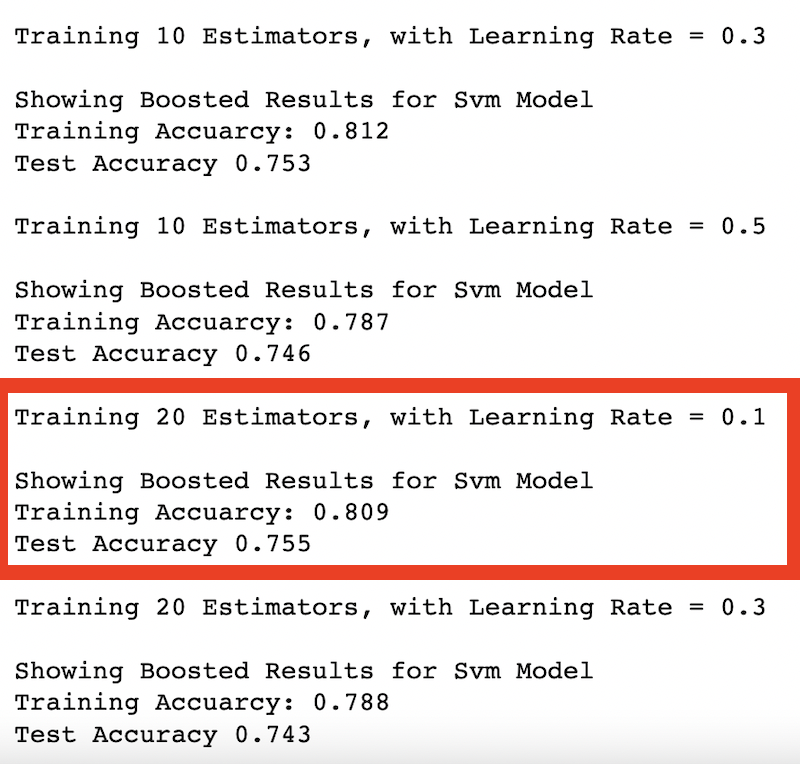

Analysis:
- Best Score: 0.755 with 20 Estimators at learning rate of 0.1.
- No clear increase in score compared to unboosted model.


### Word2Vect SVM Model, C = 1000


Showing results for Svm Model, C = 1000


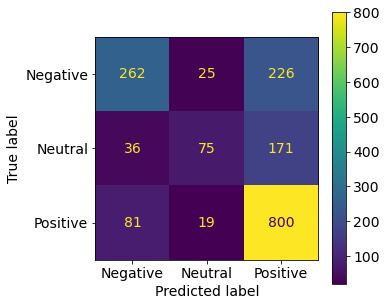

Classification Report: 
               precision    recall  f1-score   support

          -1       0.69      0.51      0.59       513
           0       0.63      0.27      0.37       282
           1       0.67      0.89      0.76       900

    accuracy                           0.67      1695
   macro avg       0.66      0.56      0.57      1695
weighted avg       0.67      0.67      0.65      1695

Training Accuarcy: 0.694
Test Accuracy 0.671


In [72]:
train_score_w2v, test_score_w2v, clf_w2v = get_w2v_model(df_copy, model = "svm", C = 1000)

In [73]:
# num_est = [5, 10, 20]
# lr = [0.1, 0.3, 0.5]
# score_dict = {}

# for n_est in num_est: 
#     score_dict[n_est] = []
    
#     for rate in lr:
#         print(f"\nTraining {n_est} Estimators, with Learning Rate = {rate}")
#         train_score, test_score, _ = boost_model(X, y, clf_w2v, n_est = n_est, rate = rate)
#         score_dict[n_est].append(test_score)

# max_score = 0
# best_lr = 0
# best_n_est = 0

# for key, value in score_dict.items():
#     index = np.argmax(score_dict[key])
#     if max_score <= max(score_dict[key]):
#         max_score = max(score_dict[key])
#         best_lr = lr[index]
#         best_n_est = key
#     else: 
#         max_score = max_score
#         best_lr = best_lr
#         best_n_est = best_n_est

# print("Best Score: %.3f, Best Learning Rate: %.2f, Best Number of Estimators: %d" %(max_score, best_lr, best_n_est))

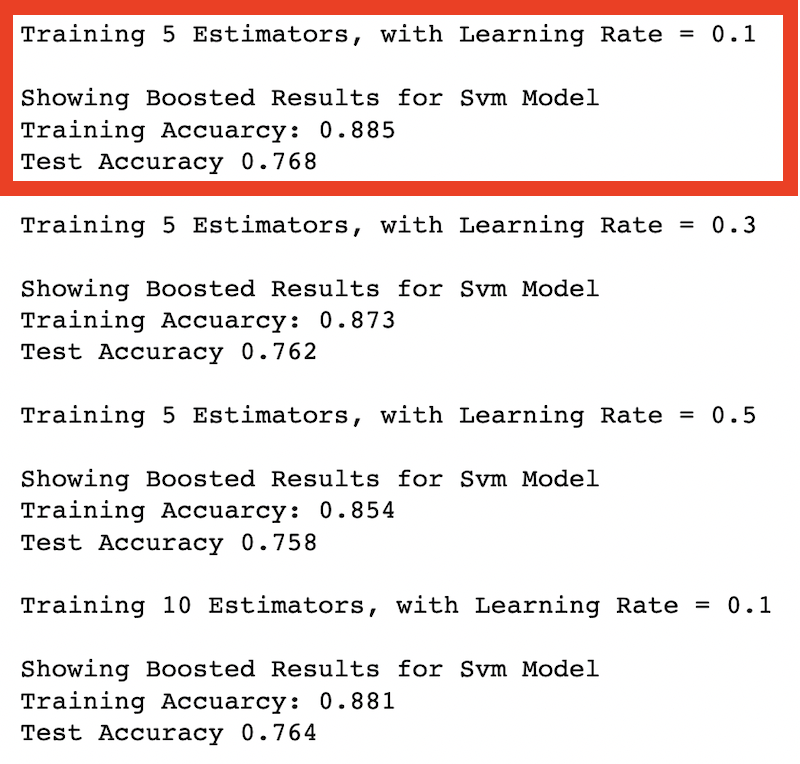

Analysis:
- Best Score: 0.768 with 5 Estimators at learning rate of 0.1.
- Boosted scores are significantly better than unboosted score.
- However, the extent of overfitting is quite high.
- The extent of overfitting seems to decrease as we increase the number of estimators and learning rate but given the increase in computational cost with increase in the number of estimators, and given that the best score for boosted W2V model is not significantly better than the unboosted TF-IDF model, we will use unboosted TF-IDF as the final model. 

### Final Model: SVM + TF-IDF with C = 0.5, Validation Accuracy Score = 0.78

## 5.3 Final Testing Using 2000 - 2009 Data

In [74]:
## Final Test Data - News Articles from 2000 - 2009
X_test = df_test["shorts"]
y_test = df_test["class"]



Showing results for Svm Model, C = 0.5


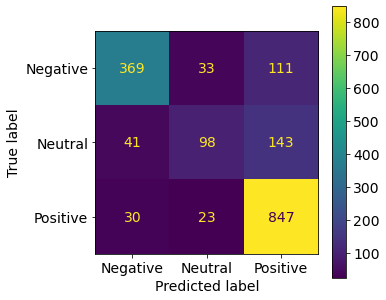

Classification Report: 
               precision    recall  f1-score   support

          -1       0.84      0.72      0.77       513
           0       0.64      0.35      0.45       282
           1       0.77      0.94      0.85       900

    accuracy                           0.78      1695
   macro avg       0.75      0.67      0.69      1695
weighted avg       0.77      0.78      0.76      1695

Training Accuarcy: 0.828
Test Accuracy 0.775


In [75]:
## Final Model - Unboosted SVM + TF-IDF, C = 0.5
train_score, val_score, clf, vector = get_vector_model(X, y, C = 0.5, model = "svm", v_name = "tfidf")


Showing results for the Final Predictive Model


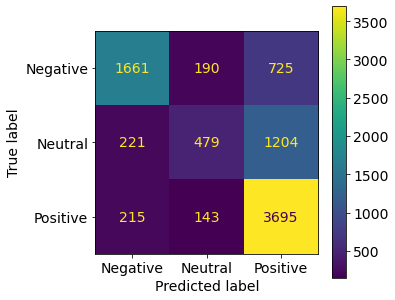

Classification Report: 
               precision    recall  f1-score   support

          -1       0.79      0.64      0.71      2576
           0       0.59      0.25      0.35      1904
           1       0.66      0.91      0.76      4053

    accuracy                           0.68      8533
   macro avg       0.68      0.60      0.61      8533
weighted avg       0.68      0.68      0.66      8533

Validation Accuarcy: 0.775
Test Accuracy 0.684


In [76]:
## Prepare the test data and make predictions using the model
A = vector.transform(X_test)

pred = clf.predict(A)
prob = clf.predict_proba(A)
    
test_score = accuracy_score(y_test, pred)

print(f"\nShowing results for the Final Predictive Model")

show_summary_report(y_test, pred, prob)

print(f"Validation Accuarcy: %.3f" % val_score)
print('Test Accuracy %.3f' % test_score)

Analysis & Final Summary:
- Compared to the validation score, the final test score was considerably less at 0.68.
- However, the final model was still able to correctly classify almost 70% of the completely unseen data.
- Most of the error occurred when classifying the neutral class. It is perhaps better to classify the labels into two classes rather than three classes, especially when the labelling method used is not highly accurate.

## 6. Conclusion & Recommendations

In Summary:
- The Final Predictive Model chosen is SVM model using TF-IDF vectorisation method with C = 0.5 (soft margin).
- The final test score is 0.68.

Recommendations are:
- Better ways of labelling the data - better lexicon dictionaries, better scoring system, or introducing a squashing function to aggregate the final label score.
- Two-class labelling (i.e positive & negative) may have worked better than three-class labelling, since the model was very bad at predicting the neutral class.
- Better ways of filtering out the texts and pre-processing them - for example, use entity recognition.